In [1]:
import Pkg
Pkg.activate(@__DIR__)

  Activating project at `~/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/analysis`


In [2]:
using JLD2
using CairoMakie
using LaTeXStrings
using Colors
using Printf
using Statistics
using Observables
using ColorSchemes
using Optim
using Random
using SpecialFunctions
using HypergeometricFunctions
using Polylogarithms
using ADTypes
import ForwardDiff

In [3]:
include("./paper_plot_utils.jl")

plot_beta_bins

# Functions work check

In [72]:
data_paths = gethostname() == "MacBook-Air-4.local" ? ["/Users/fabianwagner/Desktop/Local Calculations/git_projects/QuantumGrav-usage/data/manifoldlike_simply_connected_256_10000/statistics.jld2"] : ["/Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_256_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_256_10000/statistics.jld2"]

2-element Vector{String}:
 "/Volumes/Causal Set Silo/causal" ⋯ 40 bytes ⋯ "cted_256_10000/statistics.jld2"
 "/Volumes/Causal Set Silo/causal" ⋯ 40 bytes ⋯ "cted_256_10000/statistics.jld2"

In [73]:
hists=load_histograms_from_paths(data_paths, :cardinalities_hist)

  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_256_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_256_10000/statistics.jld2


2-element Vector{Vector{Dict}}:
 [Dict(5 => 617, 56 => 81, 35 => 156, 55 => 76, 110 => 6, 114 => 6, 123 => 1, 60 => 77, 30 => 170, 32 => 170…), Dict(5 => 595, 56 => 66, 35 => 144, 55 => 64, 110 => 1, 114 => 3, 60 => 58, 30 => 180, 32 => 181, 6 => 535…), Dict(5 => 585, 56 => 93, 35 => 171, 55 => 123, 110 => 13, 114 => 5, 123 => 2, 60 => 97, 30 => 201, 32 => 203…), Dict(5 => 571, 56 => 100, 35 => 167, 55 => 112, 110 => 12, 114 => 6, 123 => 2, 60 => 85, 30 => 208, 32 => 190…), Dict(5 => 531, 56 => 36, 35 => 85, 55 => 35, 79 => 2, 16 => 235, 20 => 174, 60 => 21, 81 => 1, 30 => 123…), Dict(5 => 617, 56 => 106, 35 => 163, 55 => 97, 110 => 5, 114 => 10, 123 => 4, 60 => 85, 30 => 214, 32 => 199…), Dict(5 => 657, 56 => 68, 35 => 126, 55 => 79, 110 => 6, 114 => 7, 123 => 3, 60 => 59, 30 => 174, 32 => 183…), Dict(5 => 554, 56 => 48, 35 => 85, 55 => 43, 110 => 2, 60 => 30, 30 => 153, 32 => 106, 6 => 517, 67 => 37…), Dict(5 => 584, 56 => 88, 35 => 141, 55 => 82, 110 => 20, 114 => 15, 123 => 7, 60 =

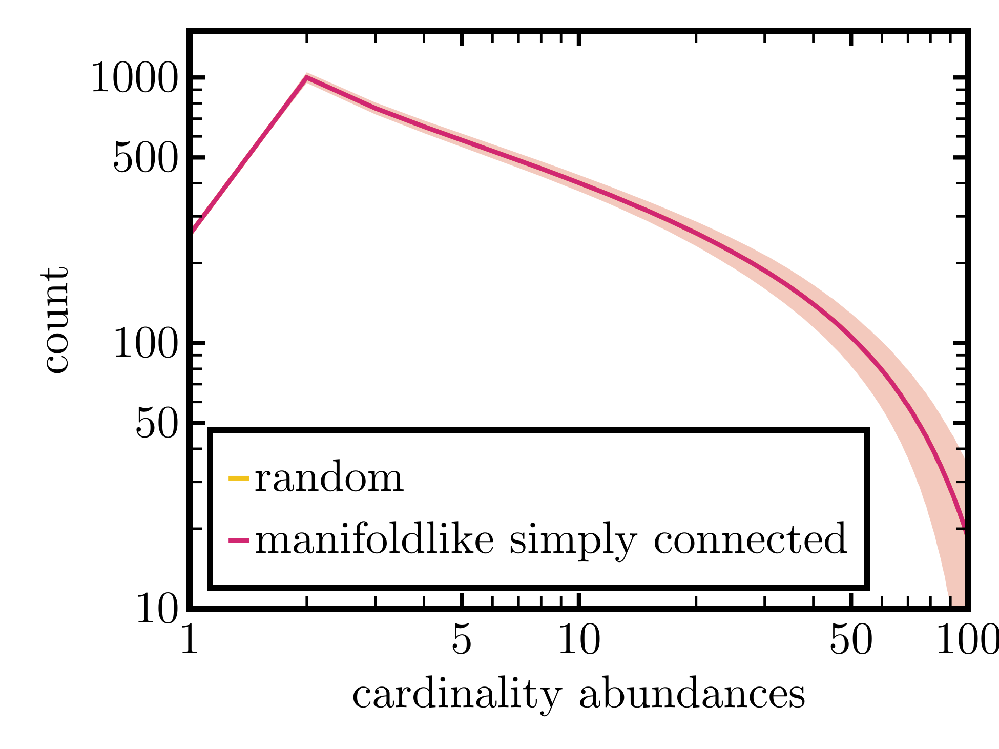

In [74]:
include("./paper_plot_utils.jl")

average_std_plot_data = [average_histogram_with_std(hists[i]) for i in 1:length(hists)]
plot_mean_histograms_with_std(
    average_std_plot_data; 
    logscale_x = true, 
    logscale_y = true, 
    xlim = (1., 100.), 
    ylim = (1.e1, 1500.), 
    xlabel = "cardinality abundances", 
    hist_labels = gethostname() == "MacBook-Air-4.local" ? ["random"] : ["random", "manifoldlike simply connected"], 
    magnification = 3,
    legendpos = :lb,
    legendmargin = (20,20,20,20)
    )

starting cumsums
first done
ending cumsums


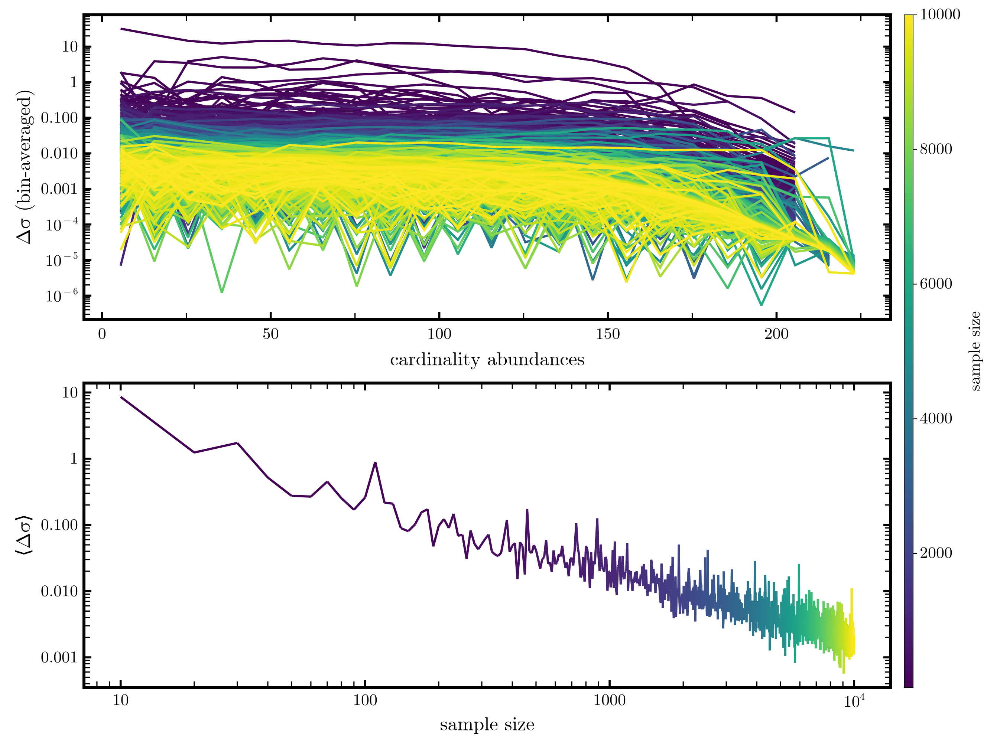

CairoMakie.Screen{IMAGE}


In [47]:
include("./paper_plot_utils.jl")


display(convergence_plots_std_change(
    hists[1];
    double_column = true,
    bin_average = 10,
    batchsize = 10,
    magnification = 2,
    xlabel = "cardinality abundances"))

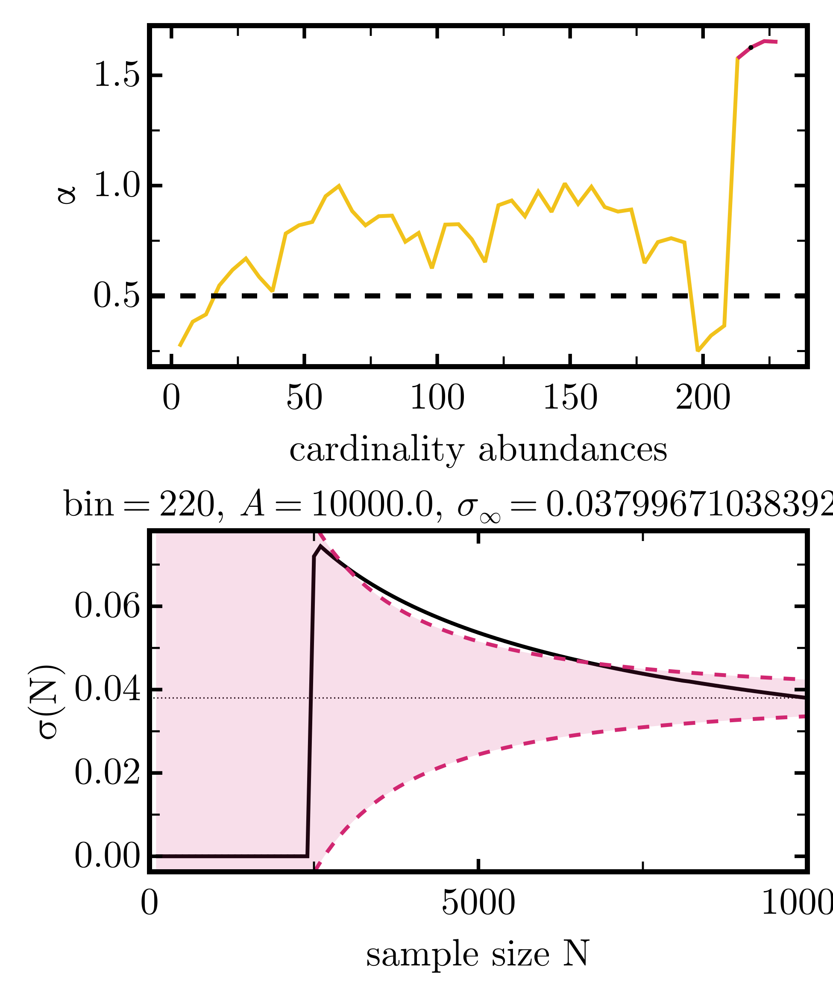

In [121]:
include("./paper_plot_utils.jl")

dense_hists = densify_hists(hists[1])

plot_alpha_bins(dense_hists; 
batchsize = 100,
bin_average = 5,
xlabel = "cardinality abundances",
bin_plot = 220,
N0 = 1,
magnification = 3,
flag_zero_frac = .05)


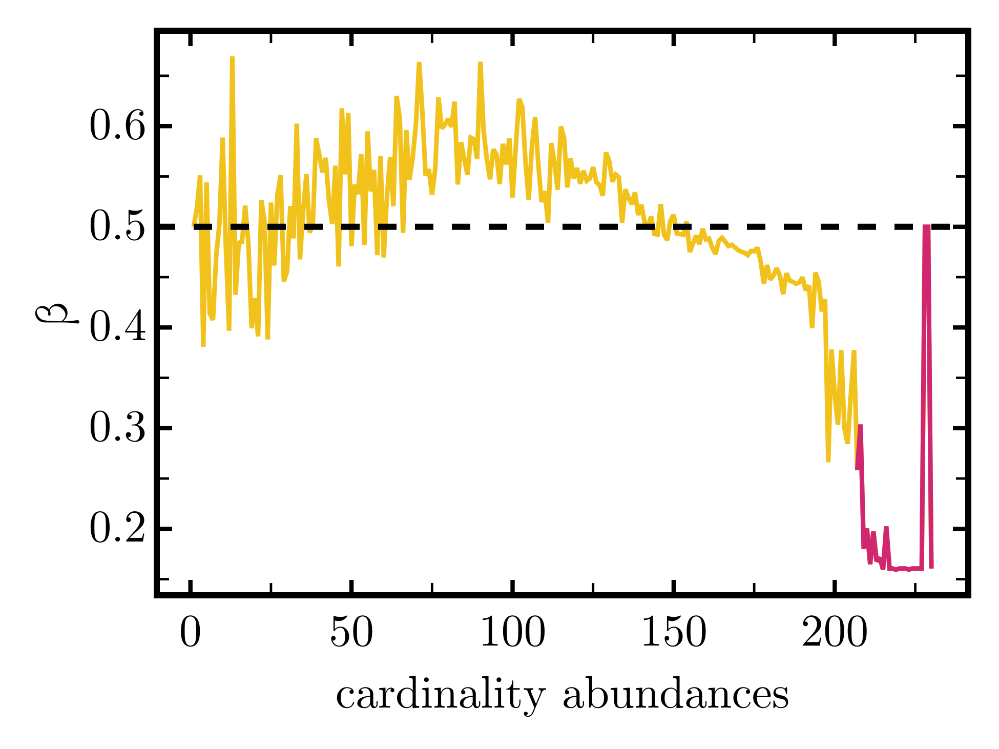

In [112]:
include("./paper_plot_utils.jl")

plot_beta_bins(dense_hists; 
batchsize = 1,
bin_average = 1,
xlabel = "cardinality abundances",
#bin_plot = 190,
N0 = 1,
magnification = 3,
flag_zero_frac = .05)

# Random

## Sizes

In [46]:
data_paths_random = ["/Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_256_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/random_512_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/random_1024_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/random_2048_10000/statistics.jld2"]
abundance_hists_random=load_histograms_from_paths(data_paths_random, :cardinalities_hist)

  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_256_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/random_512_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_1024_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/random_2048_10000/statistics.jld2


4-element Vector{Vector{Dict}}:
 [Dict(5 => 617, 56 => 81, 35 => 156, 55 => 76, 110 => 6, 114 => 6, 123 => 1, 60 => 77, 30 => 170, 32 => 170…), Dict(5 => 595, 56 => 66, 35 => 144, 55 => 64, 110 => 1, 114 => 3, 60 => 58, 30 => 180, 32 => 181, 6 => 535…), Dict(5 => 585, 56 => 93, 35 => 171, 55 => 123, 110 => 13, 114 => 5, 123 => 2, 60 => 97, 30 => 201, 32 => 203…), Dict(5 => 571, 56 => 100, 35 => 167, 55 => 112, 110 => 12, 114 => 6, 123 => 2, 60 => 85, 30 => 208, 32 => 190…), Dict(5 => 531, 56 => 36, 35 => 85, 55 => 35, 79 => 2, 16 => 235, 20 => 174, 60 => 21, 81 => 1, 30 => 123…), Dict(5 => 617, 56 => 106, 35 => 163, 55 => 97, 110 => 5, 114 => 10, 123 => 4, 60 => 85, 30 => 214, 32 => 199…), Dict(5 => 657, 56 => 68, 35 => 126, 55 => 79, 110 => 6, 114 => 7, 123 => 3, 60 => 59, 30 => 174, 32 => 183…), Dict(5 => 554, 56 => 48, 35 => 85, 55 => 43, 110 => 2, 60 => 30, 30 => 153, 32 => 106, 6 => 517, 67 => 37…), Dict(5 => 584, 56 => 88, 35 => 141, 55 => 82, 110 => 20, 114 => 15, 123 => 7, 60 =

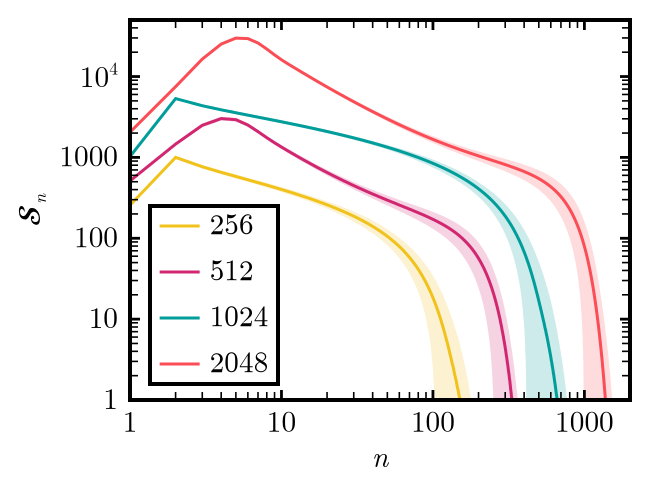

CairoMakie.Screen{IMAGE}


In [47]:
include("./paper_plot_utils.jl")

average_std_plot_data_random = [average_histogram_with_std(abundance_hists_random[i]) for i in 1:length(abundance_hists_random)]
abundances_random_size_comp_plot = plot_mean_histograms_with_std(
    average_std_plot_data_random; 
    logscale_x = true, 
    logscale_y = true, 
    xlim = (1., 2000.), 
    ylim = (1.e0, 50000.), 
    xlabel = L"n", 
    ylabel = L"\mathcal{S}_n",
    hist_labels = ["256", "512", "1024", "2048"], 
    magnification = 1,
    legendpos = :lb,
    legendmargin = (10, 8, 8, 8),
    legendpadding = (5,5,0,0)
    )

save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_random_size_comp_plot.pdf", 
    abundances_random_size_comp_plot)

display(abundances_random_size_comp_plot)

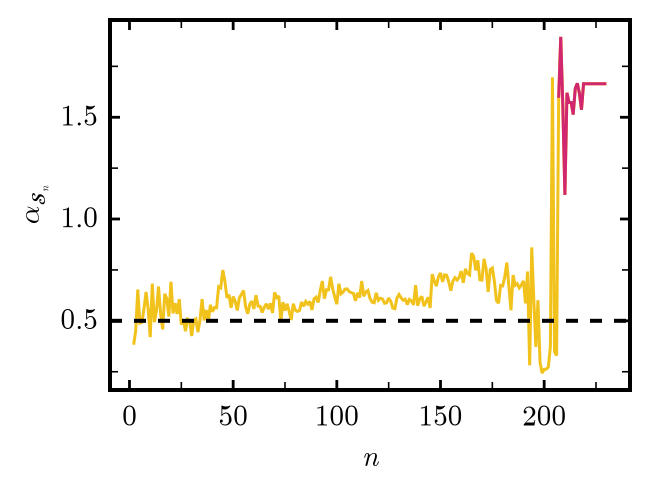

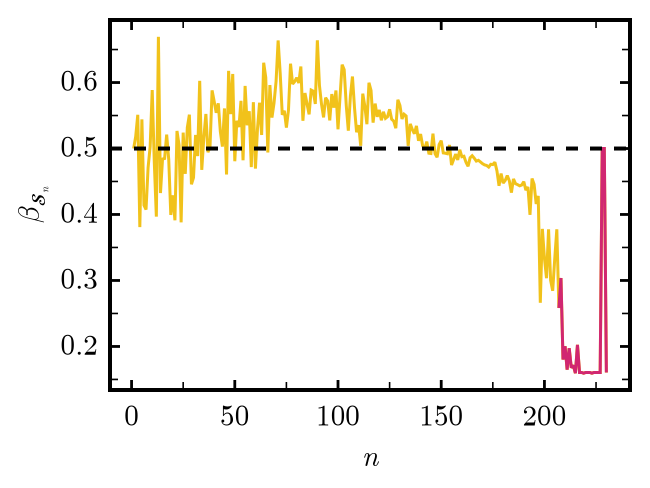

In [48]:
include("./paper_plot_utils.jl")

dense_hists = densify_hists(abundance_hists_random[1])

abundances_random_std_exp = plot_alpha_bins(dense_hists; 
batchsize = 1,
bin_average = 1,
xlabel = L"n",
ylabel = L"\alpha_{\mathcal{S}_n}",
#bin_plot = 150,
N0 = 1,
magnification = 1)

abundances_random_mean_exp = plot_beta_bins(dense_hists; 
batchsize = 1,
bin_average = 1,
xlabel = L"n",
ylabel = L"\beta_{\mathcal{S}_n}",
#bin_plot = 190,
N0 = 1,
magnification = 1)

save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_random_mean_exp.pdf", 
    abundances_random_mean_exp)
save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_random_std_exp.pdf", 
    abundances_random_std_exp)

foreach(display, 
    [abundances_random_std_exp, 
    abundances_random_mean_exp])

## Comparison higher D Minkowski sprinkling

In [56]:
data_paths_comp_random_mink = ["/Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_256_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_3D_256_500/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/random_256_10000/statistics.jld2"]
abundance_hists_comp_random_mink=load_histograms_from_paths(data_paths_comp_random_mink, :cardinalities_hist)

  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_256_10000/statistics.jld2
  Loaded 500 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_3D_256_500/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/random_256_10000/statistics.jld2


3-element Vector{Vector{Dict}}:
 [Dict(5 => 617, 56 => 81, 35 => 156, 55 => 76, 110 => 6, 114 => 6, 123 => 1, 60 => 77, 30 => 170, 32 => 170…), Dict(5 => 595, 56 => 66, 35 => 144, 55 => 64, 110 => 1, 114 => 3, 60 => 58, 30 => 180, 32 => 181, 6 => 535…), Dict(5 => 585, 56 => 93, 35 => 171, 55 => 123, 110 => 13, 114 => 5, 123 => 2, 60 => 97, 30 => 201, 32 => 203…), Dict(5 => 571, 56 => 100, 35 => 167, 55 => 112, 110 => 12, 114 => 6, 123 => 2, 60 => 85, 30 => 208, 32 => 190…), Dict(5 => 531, 56 => 36, 35 => 85, 55 => 35, 79 => 2, 16 => 235, 20 => 174, 60 => 21, 81 => 1, 30 => 123…), Dict(5 => 617, 56 => 106, 35 => 163, 55 => 97, 110 => 5, 114 => 10, 123 => 4, 60 => 85, 30 => 214, 32 => 199…), Dict(5 => 657, 56 => 68, 35 => 126, 55 => 79, 110 => 6, 114 => 7, 123 => 3, 60 => 59, 30 => 174, 32 => 183…), Dict(5 => 554, 56 => 48, 35 => 85, 55 => 43, 110 => 2, 60 => 30, 30 => 153, 32 => 106, 6 => 517, 67 => 37…), Dict(5 => 584, 56 => 88, 35 => 141, 55 => 82, 110 => 20, 114 => 15, 123 => 7, 60 =

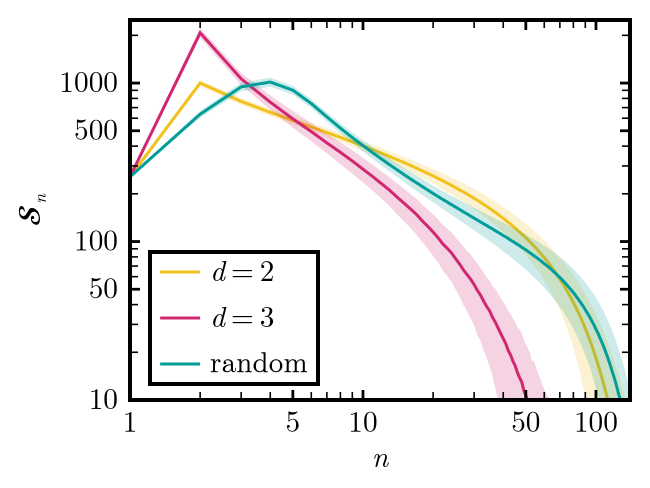

CairoMakie.Screen{IMAGE}


In [64]:
include("./paper_plot_utils.jl")

average_std_plot_data_comp_random_mink = [average_histogram_with_std(abundance_hists_comp_random_mink[i]) for i in 1:length(abundance_hists_comp_random_mink)]
abundances_comp_random_mink = plot_mean_histograms_with_std(
    average_std_plot_data_comp_random_mink; 
    logscale_x = true, 
    logscale_y = true, 
    xlim = (1., 140.), 
    ylim = (1.e1, 2500.), 
    xlabel = L"n", 
    ylabel = L"\mathcal{S}_n",
    hist_labels = [L"d=2", L"d=3", "random"], 
    magnification = 1,
    legendpos = :lb,
    legendmargin = (10, 8, 8, 8),
    legendpadding = (5,5,0,0)
    )

save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_comp_random_mink.pdf", 
    abundances_comp_random_mink)

display(abundances_comp_random_mink)

# Manifoldlike simply connected

## Sizes

In [77]:
data_paths_manifoldlike_simply_connected = ["/Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_256_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_512_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_1024_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_2048_10000/statistics.jld2"]
abundance_hists_manifoldlike_simply_connected=load_histograms_from_paths(data_paths_manifoldlike_simply_connected, :cardinalities_hist)

  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_256_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_512_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_1024_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_2048_10000/statistics.jld2


4-element Vector{Vector{Dict}}:
 [Dict(5 => 617, 56 => 81, 35 => 156, 55 => 76, 110 => 6, 114 => 6, 123 => 1, 60 => 77, 30 => 170, 32 => 170…), Dict(5 => 595, 56 => 66, 35 => 144, 55 => 64, 110 => 1, 114 => 3, 60 => 58, 30 => 180, 32 => 181, 6 => 535…), Dict(5 => 585, 56 => 93, 35 => 171, 55 => 123, 110 => 13, 114 => 5, 123 => 2, 60 => 97, 30 => 201, 32 => 203…), Dict(5 => 571, 56 => 100, 35 => 167, 55 => 112, 110 => 12, 114 => 6, 123 => 2, 60 => 85, 30 => 208, 32 => 190…), Dict(5 => 531, 56 => 36, 35 => 85, 55 => 35, 79 => 2, 16 => 235, 20 => 174, 60 => 21, 81 => 1, 30 => 123…), Dict(5 => 617, 56 => 106, 35 => 163, 55 => 97, 110 => 5, 114 => 10, 123 => 4, 60 => 85, 30 => 214, 32 => 199…), Dict(5 => 657, 56 => 68, 35 => 126, 55 => 79, 110 => 6, 114 => 7, 123 => 3, 60 => 59, 30 => 174, 32 => 183…), Dict(5 => 554, 56 => 48, 35 => 85, 55 => 43, 110 => 2, 60 => 30, 30 => 153, 32 => 106, 6 => 517, 67 => 37…), Dict(5 => 584, 56 => 88, 35 => 141, 55 => 82, 110 => 20, 114 => 15, 123 => 7, 60 =

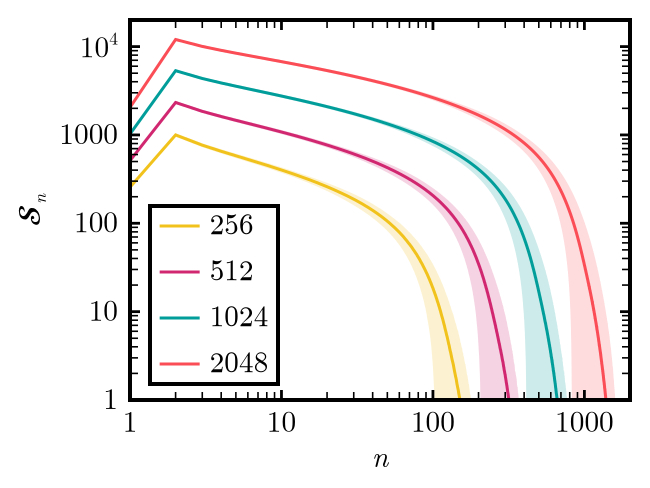

CairoMakie.Screen{IMAGE}


In [80]:
include("./paper_plot_utils.jl")

average_std_plot_data_manifoldlike_simply_connected = [average_histogram_with_std(abundance_hists_manifoldlike_simply_connected[i]) for i in 1:length(abundance_hists_manifoldlike_simply_connected)]
abundances_manifoldlike_simply_connected_size_comp_plot = plot_mean_histograms_with_std(
    average_std_plot_data_manifoldlike_simply_connected; 
    logscale_x = true, 
    logscale_y = true, 
    xlim = (1., 2000.), 
    ylim = (1.e0, 20000.), 
    xlabel = L"n", 
    ylabel = L"\mathcal{S}_n",
    hist_labels = ["256", "512", "1024", "2048"], 
    magnification = 1,
    legendpos = :lb,
    legendmargin = (10, 8, 8, 8),
    legendpadding = (5,5,0,0)
    )

save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_manifoldlike_simply_connected_size_comp_plot.pdf", 
    abundances_manifoldlike_simply_connected_size_comp_plot)

display(abundances_manifoldlike_simply_connected_size_comp_plot)

### Convergence plots

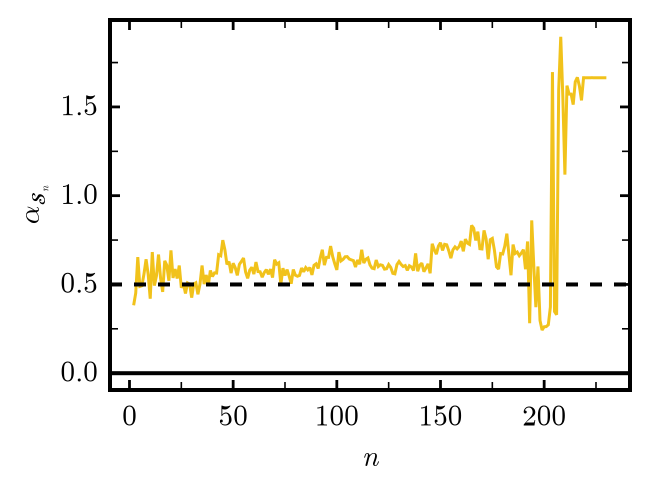

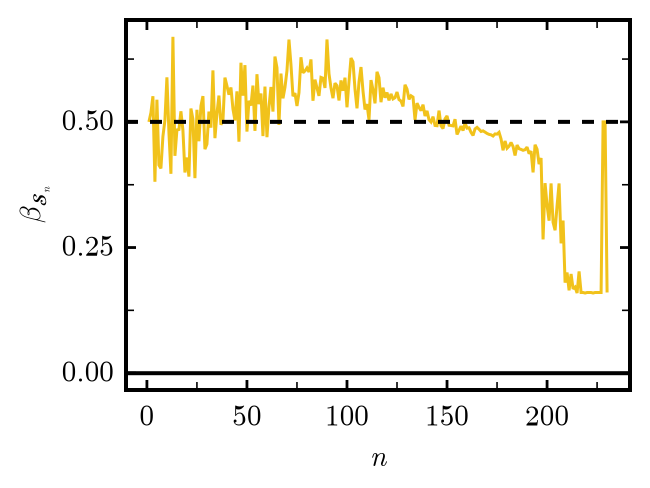

In [81]:
include("./paper_plot_utils.jl")

dense_hists_manifoldlike_simply_connected = densify_hists(abundance_hists_manifoldlike_simply_connected[1])

abundances_manifoldlike_simply_connected_std_exp = plot_alpha_bins(dense_hists_manifoldlike_simply_connected; 
batchsize = 1,
bin_average = 1,
xlabel = L"n",
ylabel = L"\alpha_{\mathcal{S}_n}",
#bin_plot = 150,
N0 = 1,
magnification = 1)

abundances_manifoldlike_simply_connected_mean_exp = plot_beta_bins(dense_hists_manifoldlike_simply_connected; 
batchsize = 1,
bin_average = 1,
xlabel = L"n",
ylabel = L"\beta_{\mathcal{S}_n}",
#bin_plot = 190,
N0 = 1,
magnification = 1)

save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_manifoldlike_simply_connected_mean_exp.pdf", 
    abundances_manifoldlike_simply_connected_mean_exp)
save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_manifoldlike_simply_connected_std_exp.pdf", 
    abundances_manifoldlike_simply_connected_std_exp)

foreach(display, 
    [abundances_manifoldlike_simply_connected_std_exp, 
    abundances_manifoldlike_simply_connected_mean_exp])

## Dimension check

In [73]:
include("./paper_plot_utils.jl")
data_paths_manifoldlike_simply_connected_dim = ["/Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_256_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_3D_256_500/statistics.jld2"]
abundance_hists_manifoldlike_simply_connected_dim=load_histograms_from_paths(data_paths_manifoldlike_simply_connected_dim, :cardinalities_hist)

  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_256_10000/statistics.jld2
  Loaded 500 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_3D_256_500/statistics.jld2


2-element Vector{Vector{Dict}}:
 [Dict(5 => 617, 56 => 81, 35 => 156, 55 => 76, 110 => 6, 114 => 6, 123 => 1, 60 => 77, 30 => 170, 32 => 170…), Dict(5 => 595, 56 => 66, 35 => 144, 55 => 64, 110 => 1, 114 => 3, 60 => 58, 30 => 180, 32 => 181, 6 => 535…), Dict(5 => 585, 56 => 93, 35 => 171, 55 => 123, 110 => 13, 114 => 5, 123 => 2, 60 => 97, 30 => 201, 32 => 203…), Dict(5 => 571, 56 => 100, 35 => 167, 55 => 112, 110 => 12, 114 => 6, 123 => 2, 60 => 85, 30 => 208, 32 => 190…), Dict(5 => 531, 56 => 36, 35 => 85, 55 => 35, 79 => 2, 16 => 235, 20 => 174, 60 => 21, 81 => 1, 30 => 123…), Dict(5 => 617, 56 => 106, 35 => 163, 55 => 97, 110 => 5, 114 => 10, 123 => 4, 60 => 85, 30 => 214, 32 => 199…), Dict(5 => 657, 56 => 68, 35 => 126, 55 => 79, 110 => 6, 114 => 7, 123 => 3, 60 => 59, 30 => 174, 32 => 183…), Dict(5 => 554, 56 => 48, 35 => 85, 55 => 43, 110 => 2, 60 => 30, 30 => 153, 32 => 106, 6 => 517, 67 => 37…), Dict(5 => 584, 56 => 88, 35 => 141, 55 => 82, 110 => 20, 114 => 15, 123 => 7, 60 =

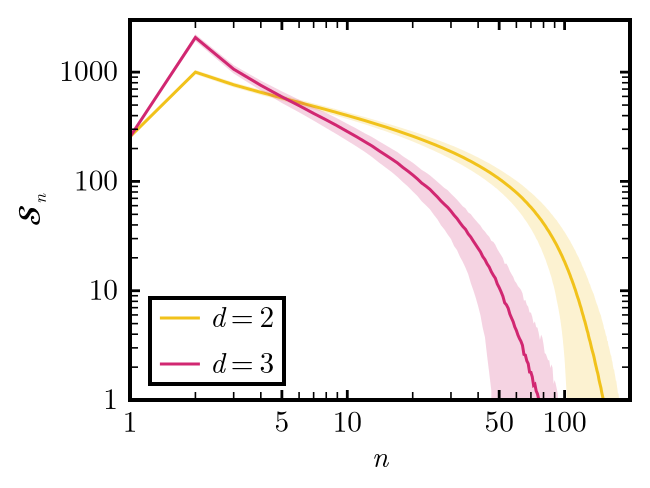

CairoMakie.Screen{IMAGE}


In [74]:
include("./paper_plot_utils.jl")

average_std_plot_data_manifoldlike_simply_connected_dim = [average_histogram_with_std(abundance_hists_manifoldlike_simply_connected_dim[i]) for i in 1:length(abundance_hists_manifoldlike_simply_connected_dim)]
abundances_manifoldlike_simply_connected_dim = plot_mean_histograms_with_std(
    average_std_plot_data_manifoldlike_simply_connected_dim; 
    logscale_x = true, 
    logscale_y = true, 
    xlim = (1., 200.), 
    ylim = (1.e0, 3000.), 
    xlabel = L"n", 
    ylabel = L"\mathcal{S}_n",
    hist_labels = [L"d=2", L"d=3"], 
    magnification = 1,
    legendpos = :lb,
    legendmargin = (10, 8, 8, 8),
    legendpadding = (5,5,0,0)
    )

save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_manifoldlike_simply_connected_dim_plot.pdf", 
    abundances_manifoldlike_simply_connected_dim)

display(abundances_manifoldlike_simply_connected_dim)

### Convergence plots

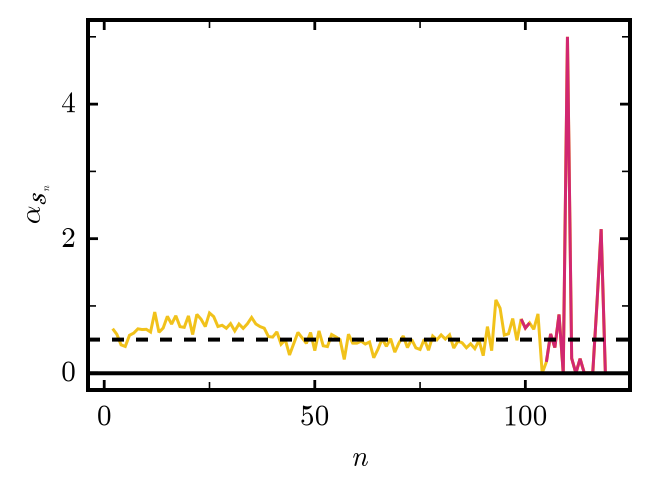

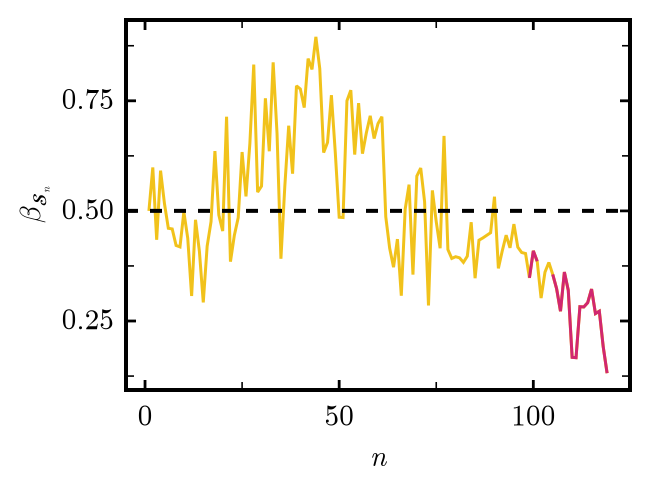

In [75]:
include("./paper_plot_utils.jl")

dense_hists_manifoldlike_simply_connected_dim = densify_hists(abundance_hists_manifoldlike_simply_connected_dim[2])

abundances_manifoldlike_simply_connected_std_exp_dim = plot_alpha_bins(dense_hists_manifoldlike_simply_connected_dim; 
batchsize = 1,
bin_average = 1,
xlabel = L"n",
ylabel = L"\alpha_{\mathcal{S}_n}",
#bin_plot = 150,
N0 = 1,
magnification = 1)

abundances_manifoldlike_simply_connected_mean_exp_dim = plot_beta_bins(dense_hists_manifoldlike_simply_connected_dim; 
batchsize = 1,
bin_average = 1,
xlabel = L"n",
ylabel = L"\beta_{\mathcal{S}_n}",
#bin_plot = 190,
N0 = 1,
magnification = 1)

save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_manifoldlike_simply_connected_mean_exp.pdf", 
    abundances_manifoldlike_simply_connected_mean_exp_dim)
save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_manifoldlike_simply_connected_std_exp.pdf", 
    abundances_manifoldlike_simply_connected_std_exp_dim)

foreach(display, 
    [abundances_manifoldlike_simply_connected_std_exp_dim, 
    abundances_manifoldlike_simply_connected_mean_exp_dim])

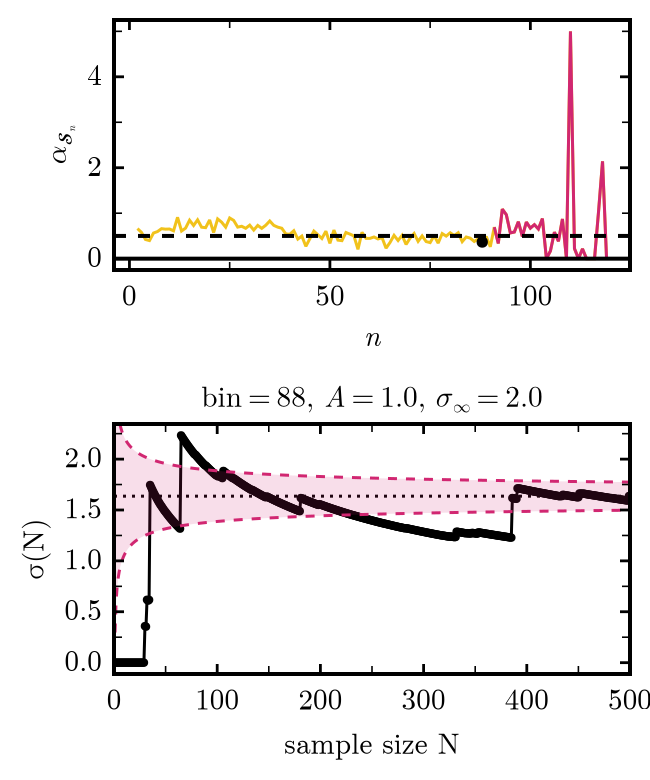

In [76]:
include("./paper_plot_utils.jl")
abundances_manifoldlike_simply_connected_std_exp_dim_5 = plot_alpha_bins(dense_hists_manifoldlike_simply_connected_dim; 
batchsize = 1,
bin_average = 1,
xlabel = L"n",
ylabel = L"\alpha_{\mathcal{S}_n}",
bin_plot = 88,
N0 = 1,
magnification = 1,
flag_zero_frac = 0.03)

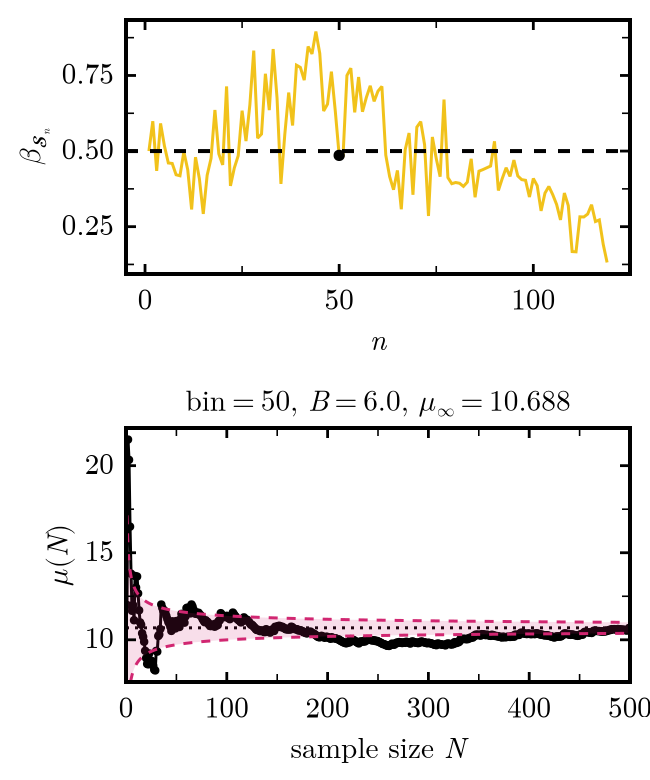

In [78]:
include("./paper_plot_utils.jl")
abundances_manifoldlike_simply_connected_mean_exp_dim_5 = plot_beta_bins(dense_hists_manifoldlike_simply_connected_dim; 
batchsize = 1,
bin_average = 1,
xlabel = L"n",
ylabel = L"\beta_{\mathcal{S}_n}",
bin_plot = 50,
N0 = 1,
magnification = 1,
β_init = .5,
flag_zero_frac = .8)

# Manifoldlike non-simply connected

In [82]:
data_paths_manifoldlike_non_simply_connected = ["/Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_non_simply_connected_256_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_non_simply_connected_512_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_non_simply_connected_1024_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_non_simply_connected_2048_10000/statistics.jld2"]
abundance_hists_manifoldlike_non_simply_connected=load_histograms_from_paths(data_paths_manifoldlike_non_simply_connected, :cardinalities_hist)

  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_non_simply_connected_256_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_non_simply_connected_512_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_non_simply_connected_1024_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_non_simply_connected_2048_10000/statistics.jld2


4-element Vector{Vector{Dict}}:
 [Dict(5 => 364, 56 => 6, 35 => 73, 55 => 4, 16 => 189, 20 => 150, 30 => 88, 19 => 160, 32 => 86, 49 => 4…), Dict(5 => 351, 56 => 7, 35 => 41, 55 => 7, 16 => 168, 20 => 128, 60 => 5, 30 => 50, 19 => 134, 32 => 49…), Dict(5 => 273, 35 => 26, 16 => 135, 20 => 102, 30 => 49, 19 => 121, 32 => 31, 6 => 254, 45 => 3, 44 => 2…), Dict(5 => 282, 56 => 8, 35 => 23, 55 => 11, 16 => 88, 20 => 73, 60 => 4, 30 => 31, 19 => 83, 32 => 23…), Dict(5 => 389, 56 => 12, 35 => 62, 55 => 16, 60 => 12, 30 => 67, 32 => 65, 6 => 346, 67 => 13, 45 => 31…), Dict(5 => 309, 56 => 11, 35 => 41, 55 => 13, 16 => 130, 20 => 99, 60 => 8, 30 => 54, 19 => 84, 32 => 65…), Dict(5 => 332, 56 => 14, 35 => 18, 55 => 16, 16 => 143, 20 => 151, 60 => 12, 30 => 52, 19 => 148, 32 => 39…), Dict(5 => 414, 56 => 33, 35 => 64, 55 => 27, 60 => 27, 30 => 105, 32 => 95, 6 => 351, 67 => 24, 45 => 41…), Dict(5 => 263, 56 => 2, 35 => 32, 55 => 10, 16 => 131, 20 => 86, 60 => 5, 30 => 54, 19 => 90, 32 => 34…), D

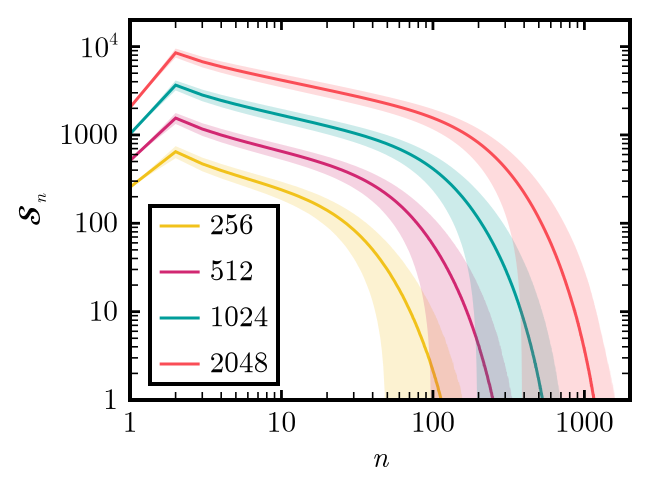

CairoMakie.Screen{IMAGE}


In [83]:
include("./paper_plot_utils.jl")

average_std_plot_data_manifoldlike_non_simply_connected = [average_histogram_with_std(abundance_hists_manifoldlike_non_simply_connected[i]) for i in 1:length(abundance_hists_manifoldlike_non_simply_connected)]
abundances_manifoldlike_non_simply_connected_size_comp_plot = plot_mean_histograms_with_std(
    average_std_plot_data_manifoldlike_non_simply_connected; 
    logscale_x = true, 
    logscale_y = true, 
    xlim = (1., 2000.), 
    ylim = (1.e0, 20000.), 
    xlabel = L"n", 
    ylabel = L"\mathcal{S}_n",
    hist_labels = ["256", "512", "1024", "2048"], 
    magnification = 1,
    legendpos = :lb,
    legendmargin = (10, 8, 8, 8),
    legendpadding = (5,5,0,0)
    )

save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_manifoldlike_non_simply_connected_size_comp_plot.pdf", 
    abundances_manifoldlike_non_simply_connected_size_comp_plot)

display(abundances_manifoldlike_non_simply_connected_size_comp_plot)

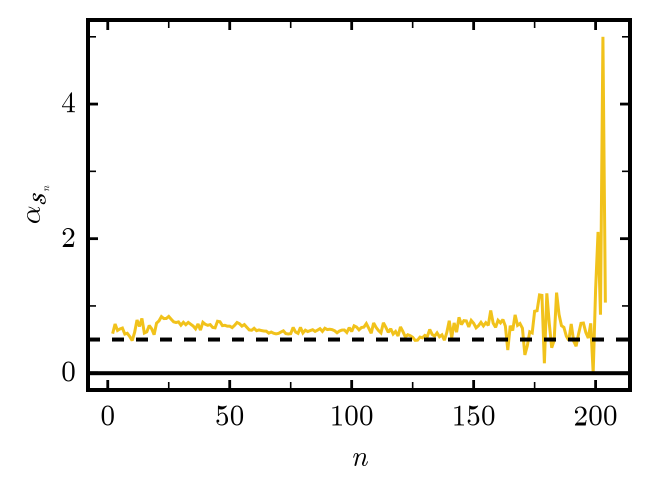

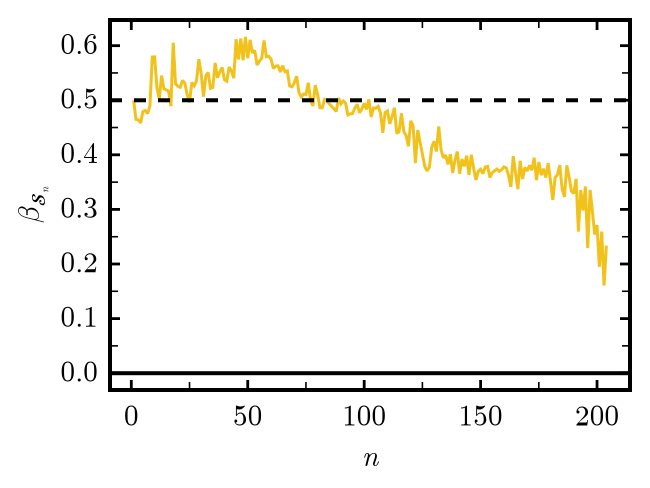

In [84]:
include("./paper_plot_utils.jl")

dense_hists_manifoldlike_non_simply_connected = densify_hists(abundance_hists_manifoldlike_non_simply_connected[1])

abundances_manifoldlike_non_simply_connected_std_exp = plot_alpha_bins(dense_hists_manifoldlike_non_simply_connected; 
batchsize = 1,
bin_average = 1,
xlabel = L"n",
ylabel = L"\alpha_{\mathcal{S}_n}",
#bin_plot = 150,
N0 = 1,
magnification = 1)

abundances_manifoldlike_non_simply_connected_mean_exp = plot_beta_bins(dense_hists_manifoldlike_non_simply_connected; 
batchsize = 1,
bin_average = 1,
xlabel = L"n",
ylabel = L"\beta_{\mathcal{S}_n}",
#bin_plot = 190,
N0 = 1,
magnification = 1)

save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_manifoldlike_non_simply_connected_mean_exp.pdf", 
    abundances_manifoldlike_non_simply_connected_mean_exp)
save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_manifoldlike_non_simply_connected_std_exp.pdf", 
    abundances_manifoldlike_non_simply_connected_std_exp)

foreach(display, 
    [abundances_manifoldlike_non_simply_connected_std_exp, 
    abundances_manifoldlike_non_simply_connected_mean_exp])

# Minkowski Quasicrystal

## Sizes

In [85]:
data_paths_minkowski_quasicrystal = ["/Volumes/Causal Set Silo/causal_sets/analysis/minkowski_quasicrystal_256_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/minkowski_quasicrystal_512_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/minkowski_quasicrystal_1024_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/minkowski_quasicrystal_2048_10000/statistics.jld2"]
abundance_hists_minkowski_quasicrystal=load_histograms_from_paths(data_paths_minkowski_quasicrystal, :cardinalities_hist)

  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/minkowski_quasicrystal_256_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/minkowski_quasicrystal_512_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/minkowski_quasicrystal_1024_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/minkowski_quasicrystal_2048_10000/statistics.jld2


4-element Vector{Vector{Dict}}:
 [Dict(56 => 55, 35 => 162, 110 => 18, 60 => 91, 30 => 141, 6 => 692, 67 => 72, 234 => 1, 73 => 43, 182 => 1…), Dict(56 => 53, 35 => 156, 110 => 22, 60 => 78, 30 => 145, 6 => 698, 67 => 72, 73 => 43, 182 => 2, 164 => 3…), Dict(56 => 61, 35 => 170, 110 => 21, 60 => 88, 30 => 145, 6 => 651, 67 => 59, 73 => 46, 182 => 1, 164 => 5…), Dict(56 => 76, 35 => 157, 110 => 22, 60 => 86, 30 => 172, 6 => 685, 67 => 53, 219 => 1, 73 => 43, 182 => 3…), Dict(56 => 67, 35 => 157, 110 => 21, 60 => 98, 30 => 150, 6 => 701, 67 => 62, 215 => 1, 73 => 42, 182 => 4…), Dict(56 => 52, 35 => 170, 110 => 30, 60 => 94, 30 => 143, 6 => 649, 67 => 65, 73 => 35, 164 => 3, 115 => 12…), Dict(56 => 56, 35 => 158, 110 => 22, 60 => 91, 30 => 140, 6 => 681, 67 => 68, 73 => 36, 182 => 1, 164 => 5…), Dict(56 => 56, 35 => 167, 110 => 20, 60 => 95, 30 => 139, 6 => 674, 67 => 71, 73 => 38, 182 => 1, 164 => 9…), Dict(56 => 58, 35 => 159, 110 => 31, 60 => 84, 30 => 169, 6 => 690, 67 => 61, 73 => 3

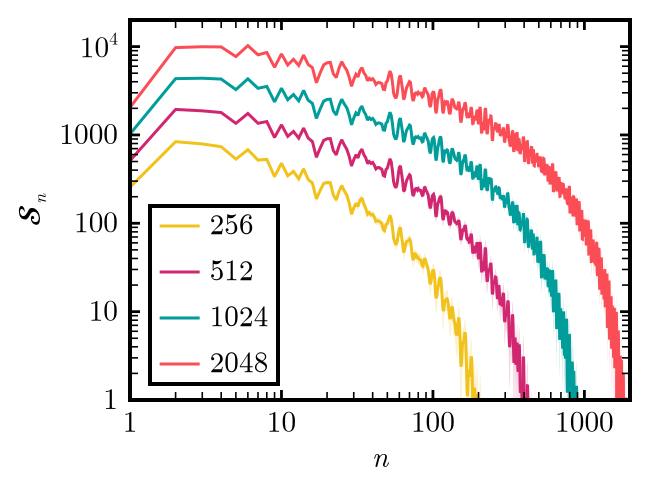

CairoMakie.Screen{IMAGE}


In [86]:
include("./paper_plot_utils.jl")

average_std_plot_data_minkowski_quasicrystal = [average_histogram_with_std(abundance_hists_minkowski_quasicrystal[i]) for i in 1:length(abundance_hists_minkowski_quasicrystal)]
abundances_minkowski_quasicrystal_size_comp_plot = plot_mean_histograms_with_std(
    average_std_plot_data_minkowski_quasicrystal; 
    logscale_x = true, 
    logscale_y = true, 
    xlim = (1., 2000.), 
    ylim = (1.e0, 20000.), 
    xlabel = L"n", 
    ylabel = L"\mathcal{S}_n",
    hist_labels = ["256", "512", "1024", "2048"], 
    magnification = 1,
    legendpos = :lb,
    legendmargin = (10, 8, 8, 8),
    legendpadding = (5,5,0,0)
    )

save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_minkowski_quasicrystal_size_comp_plot.pdf", 
    abundances_minkowski_quasicrystal_size_comp_plot)

display(abundances_minkowski_quasicrystal_size_comp_plot)

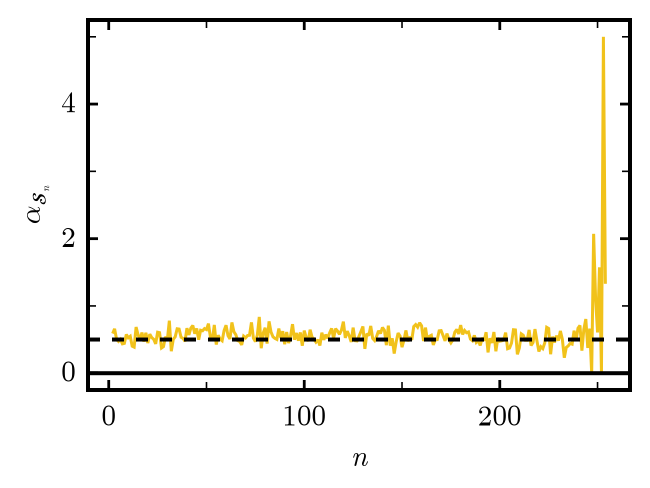

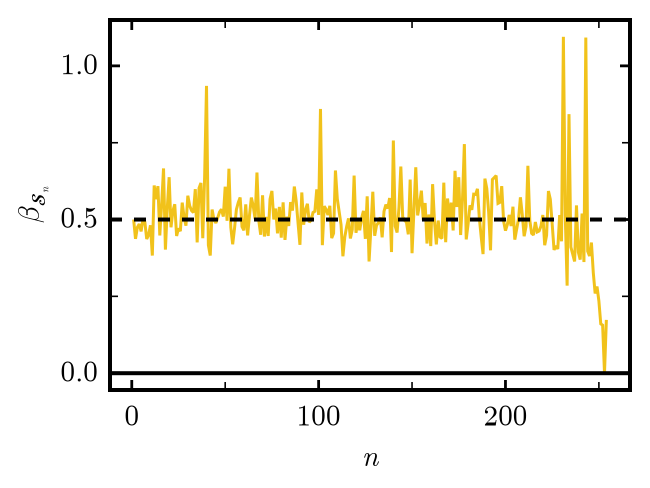

In [87]:
include("./paper_plot_utils.jl")

dense_hists_minkowski_quasicrystal = densify_hists(abundance_hists_minkowski_quasicrystal[1])

abundances_minkowski_quasicrystal_std_exp = plot_alpha_bins(dense_hists_minkowski_quasicrystal; 
batchsize = 1,
bin_average = 1,
xlabel = L"n",
ylabel = L"\alpha_{\mathcal{S}_n}",
#bin_plot = 150,
N0 = 1,
magnification = 1)

abundances_minkowski_quasicrystal_mean_exp = plot_beta_bins(dense_hists_minkowski_quasicrystal; 
batchsize = 1,
bin_average = 1,
xlabel = L"n",
ylabel = L"\beta_{\mathcal{S}_n}",
#bin_plot = 190,
N0 = 1,
magnification = 1)

save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_minkowski_quasicrystal_mean_exp.pdf", 
    abundances_minkowski_quasicrystal_mean_exp)
save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_minkowski_quasicrystal_std_exp.pdf", 
    abundances_minkowski_quasicrystal_std_exp)

foreach(display, 
    [abundances_minkowski_quasicrystal_std_exp, 
    abundances_minkowski_quasicrystal_mean_exp])

## Fit oscillating pattern

### Eyeball comparison

  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_2048_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/minkowski_quasicrystal_2048_10000/statistics.jld2


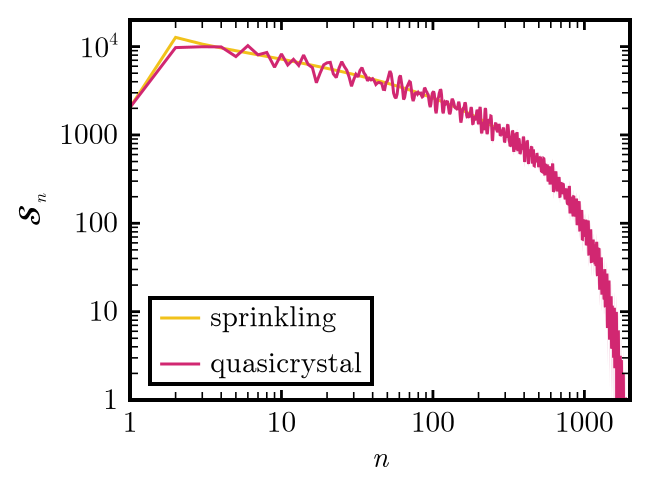

In [ ]:
data_paths_comp_mink_cryst_sprink = ["/Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_2048_10000/statistics.jld2","/Volumes/Causal Set Silo/causal_sets/analysis/minkowski_quasicrystal_2048_10000/statistics.jld2"]
abundance_hists_comp_mink_cryst_sprink=load_histograms_from_paths(data_paths_comp_mink_cryst_sprink, :cardinalities_hist)
average_std_plot_data_comp_mink_cryst_sprink = [average_histogram_with_std(abundance_hists_comp_mink_cryst_sprink[i]) for i in 1:length(abundance_hists_comp_mink_cryst_sprink)]

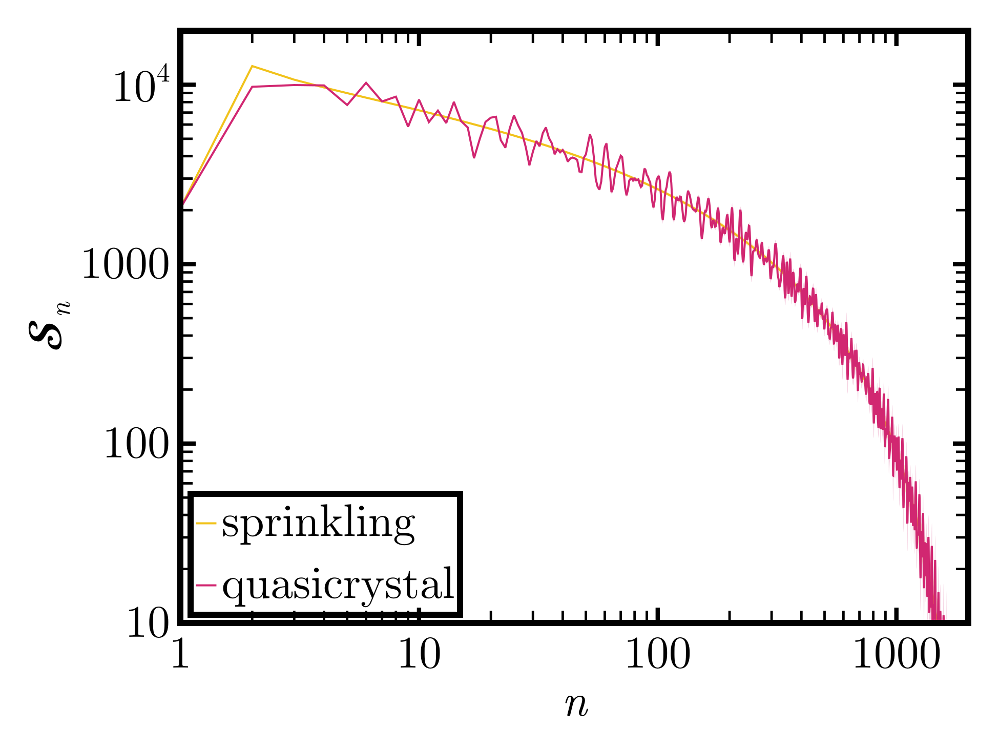

In [174]:
include("./paper_plot_utils.jl")
abundances_comp_mink_cryst_sprink_size_comp_plot = plot_mean_histograms_with_std(
    average_std_plot_data_comp_mink_cryst_sprink; 
    logscale_x = true, 
    logscale_y = true, 
    xlim = (1., 2000.), 
    ylim = (1.e1, 20000.), 
    xlabel = L"n", 
    ylabel = L"\mathcal{S}_n",
    hist_labels = ["sprinkling", "quasicrystal"], 
    magnification = 3,
    #plot_types = [:line, :scatter],
    legendpos = :lb,
    legendmargin = (10, 8, 8, 8),
    legendpadding = (5,5,0,0),
    markersize = 2,
    linewidth = 2
    )

### Fourier analysis

f_peak = 0.05405405405405406
P_est = 18.5
f = 0.05405405405405406  P ≈ 18.5  A = 0.06504631165386501
f = 0.03203203203203203  P ≈ 31.21875  A = 0.05166887939654834
f = 0.036036036036036036  P ≈ 27.75  A = 0.04346097404678746
f = 0.055055055055055056  P ≈ 18.163636363636364  A = 0.04235683948870975
f = 0.02902902902902903  P ≈ 34.44827586206896  A = 0.04171500075547071


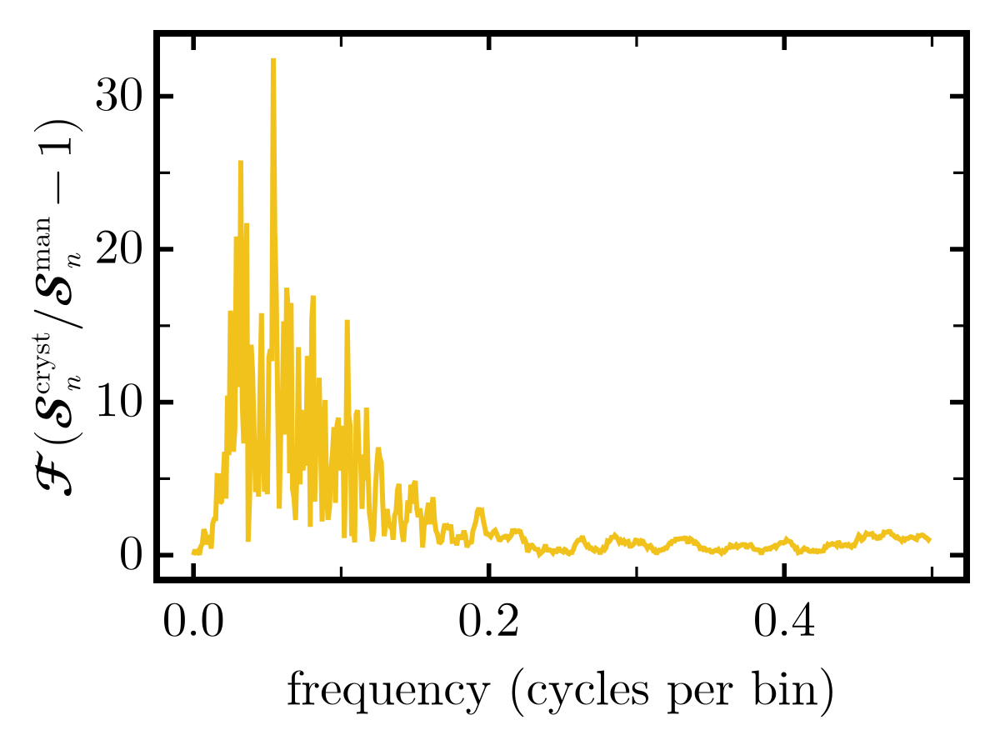

In [165]:
using FFTW
r_comp_mink_cryst_sprink = average_std_plot_data_comp_mink_cryst_sprink[2][1][2:1000] ./ average_std_plot_data_comp_mink_cryst_sprink[1][1][2:1000] .- 1
r_dev_comp_mink_cryst_sprink = r_comp_mink_cryst_sprink .- Statistics.mean(r_comp_mink_cryst_sprink);
r_dev_fou_comp_mink_cryst_sprink = abs.(fft(r_dev_comp_mink_cryst_sprink))
r_dev_freqs_comp_mink_cryst_sprink = (0:length(r_dev_comp_mink_cryst_sprink)-1) ./ length(r_dev_comp_mink_cryst_sprink)  # cycles per sample
half = 1:(fld(length(r_dev_comp_mink_cryst_sprink),2))          # skip DC at 1
peak_idx = half[argmax(r_dev_fou_comp_mink_cryst_sprink[half])]
f_peak = r_dev_freqs_comp_mink_cryst_sprink[peak_idx]
P_est = 1 / f_peak           # period in “bins”

@show f_peak P_est

k = 5
idxs = sortperm(r_dev_fou_comp_mink_cryst_sprink[half]; rev=true)[1:k]
for i in idxs
    f = r_dev_freqs_comp_mink_cryst_sprink[half[i]]
    A = 2 * abs(r_dev_fou_comp_mink_cryst_sprink[half[i]]) / length(r_dev_comp_mink_cryst_sprink)
    println("f = ", f, "  P ≈ ", 1/f, "  A = ", A)
end

apply_paper_theme!(; magnification = 2)
fig, ax = lines(r_dev_freqs_comp_mink_cryst_sprink[half], r_dev_fou_comp_mink_cryst_sprink[half])
ax.xlabel = "frequency (cycles per bin)"
ax.ylabel = L"\mathcal{F}(\mathcal{S}_n^{\mathrm{cryst}} / \mathcal{S}_n^{\mathrm{man}} -1)"

save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/fft_comp_mink_cryst_sprink.pdf", 
    fig)
fig

In [98]:
k = 5
idxs = sortperm(r_dev_fou_comp_mink_cryst_sprink[half]; rev=true)[1:k]
for i in idxs
    f = r_dev_freqs_comp_mink_cryst_sprink[half[i]]
    A = 2 * abs(r_dev_fou_comp_mink_cryst_sprink[half[i]]) / length(r_dev_comp_mink_cryst_sprink)
    println("f = ", f, "  P ≈ ", 1/f, "  A = ", A)
end


f = 0.05405405405405406  P ≈ 18.5  A = 0.06504631165386501
f = 0.03203203203203203  P ≈ 31.21875  A = 0.05166887939654834
f = 0.036036036036036036  P ≈ 27.75  A = 0.04346097404678746
f = 0.055055055055055056  P ≈ 18.163636363636364  A = 0.04235683948870975
f = 0.02902902902902903  P ≈ 34.44827586206896  A = 0.04171500075547071


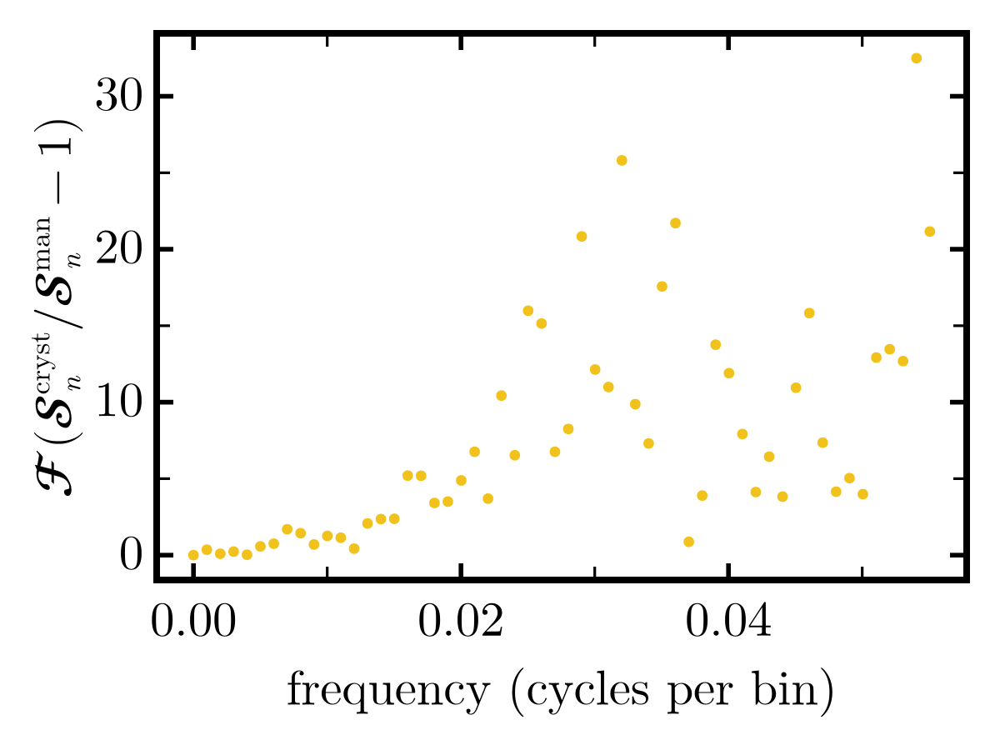

In [163]:
apply_paper_theme!(; magnification = 2)
fig, ax = scatter(r_dev_freqs_comp_mink_cryst_sprink[half], r_dev_fou_comp_mink_cryst_sprink[half])
ax.xlabel = "frequency (cycles per bin)"
ax.ylabel = L"\mathcal{F}(\mathcal{S}_n^{\mathrm{cryst}} / \mathcal{S}_n^{\mathrm{man}} -1)"

save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/fft_comp_mink_cryst_sprink.pdf", 
    fig)
fig

# Minkowski sprinklings

## Size checks

In [95]:
data_paths_minkowski_sprinkling = ["/Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_256_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_300_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_400_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_512_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_600_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_1024_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_2048_10000/statistics.jld2"]
abundance_hists_minkowski_sprinkling=load_histograms_from_paths(data_paths_minkowski_sprinkling, :cardinalities_hist)

  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_256_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_300_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_400_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_512_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_600_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_1024_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_2048_10000/statistics.jld2


7-element Vector{Vector{Dict}}:
 [Dict(56 => 71, 35 => 139, 110 => 18, 60 => 53, 30 => 153, 6 => 516, 67 => 60, 73 => 47, 115 => 11, 153 => 3…), Dict(56 => 85, 35 => 139, 110 => 18, 60 => 66, 30 => 173, 6 => 551, 67 => 55, 215 => 1, 73 => 47, 182 => 1…), Dict(56 => 55, 35 => 155, 110 => 15, 60 => 62, 30 => 185, 6 => 521, 67 => 49, 73 => 46, 182 => 1, 164 => 4…), Dict(56 => 72, 35 => 144, 110 => 16, 60 => 67, 30 => 166, 6 => 567, 67 => 66, 73 => 55, 182 => 2, 164 => 2…), Dict(56 => 68, 35 => 125, 110 => 20, 60 => 52, 30 => 157, 6 => 544, 67 => 53, 73 => 37, 182 => 3, 164 => 2…), Dict(56 => 76, 35 => 127, 110 => 24, 60 => 62, 30 => 173, 6 => 563, 67 => 53, 73 => 41, 182 => 1, 164 => 3…), Dict(56 => 60, 35 => 117, 110 => 15, 60 => 55, 30 => 134, 6 => 574, 67 => 39, 215 => 1, 73 => 38, 182 => 2…), Dict(56 => 61, 35 => 123, 110 => 13, 60 => 54, 30 => 164, 6 => 539, 67 => 41, 73 => 53, 182 => 1, 164 => 2…), Dict(56 => 69, 35 => 137, 110 => 12, 60 => 66, 30 => 172, 6 => 552, 67 => 65, 215 => 

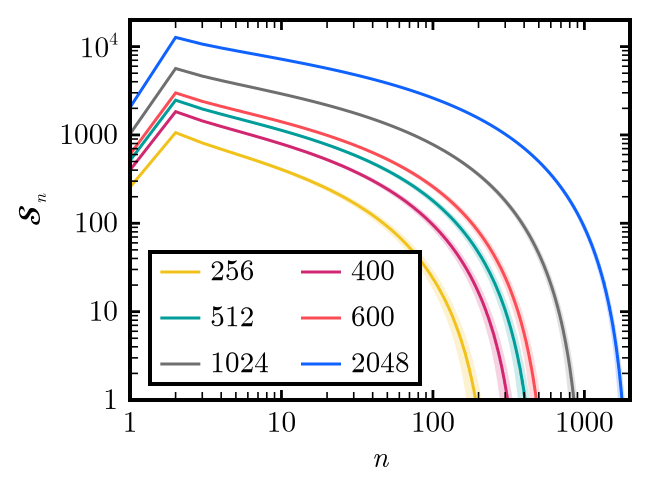

CairoMakie.Screen{IMAGE}


In [102]:
include("./paper_plot_utils.jl")

abundance_hists_minkowski_sprinkling_red = [abundance_hists_minkowski_sprinkling[i] for i in [1, 3, 4, 5, 6, 7]]

average_std_plot_data_minkowski_sprinkling = [average_histogram_with_std(hists) for hists in abundance_hists_minkowski_sprinkling_red]
abundances_minkowski_sprinkling_size_comp_plot = plot_mean_histograms_with_std(
    average_std_plot_data_minkowski_sprinkling; 
    logscale_x = true, 
    logscale_y = true, 
    xlim = (1., 2000.), 
    ylim = (1., 20000.), 
    xlabel = L"n", 
    ylabel = L"\mathcal{S}_n",
    hist_labels = ["256", "400", "512", "600", "1024", "2048"], 
    magnification = 1,
    legendpos = :lb,
    legendmargin = (10, 8, 8, 8),
    legendpadding = (5,5,0,0),
    n_Legend_columns = 2,
    )

save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_minkowski_sprinkling_size_comp_plot.pdf", 
    abundances_minkowski_sprinkling_size_comp_plot)

display(abundances_minkowski_sprinkling_size_comp_plot)

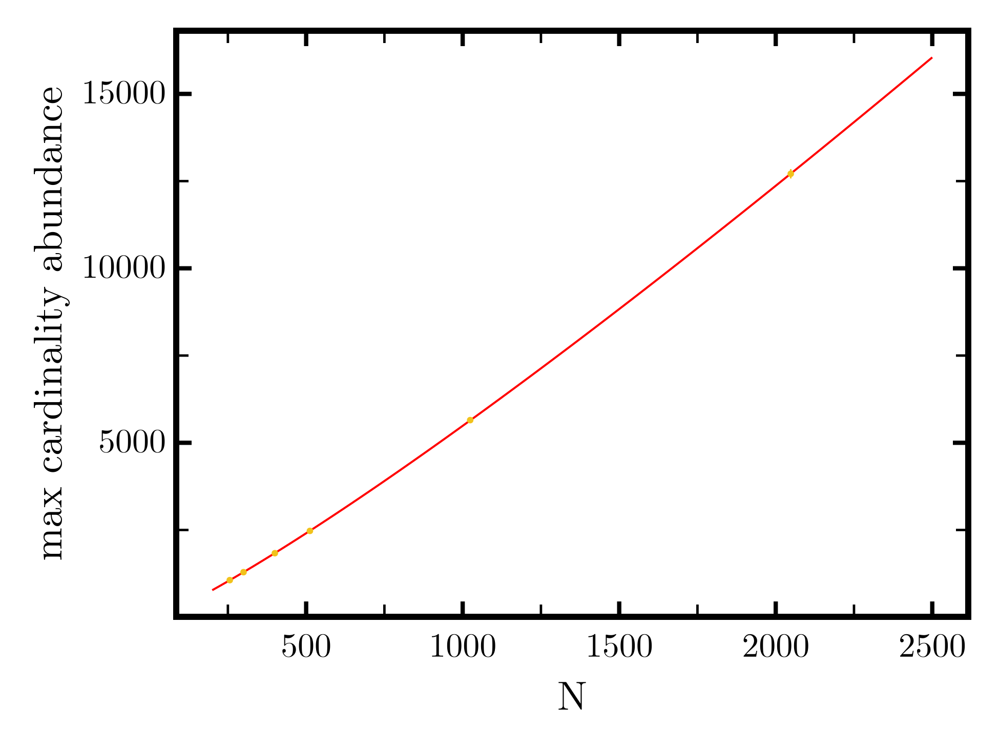

(params = (a = 1.8426324134576029, b = 1.160197345115875, c = -86.77124020418088), rel_residuals = [0.00217096948451198, -0.0006291532598169039, -0.0018409826233101044, -0.0009614407251645357, 0.0014420496672389296, -0.0002986758849948461], χ² = 0.007127008069403743)


In [ ]:
include("./paper_plot_utils.jl")

average_mink_max = [data_mink_size[i][1][2] for i in 1:length(data_mink_size)];
std_mink_max = [data_mink_size[i][2][2] for i in 1:length(data_mink_size)];
fit_res_mink_max = fit_histogram_bins(
    average_mink_max    ,
    (x, p) -> p.c + p.a * x .^ p.b,
    (:a, :b, :c),
    1,
    6;
    stds = std_mink_max,
    minimize_χ² = true,
    #init = (a = 1., b = 1., c = 1.),
    x_values = [256.0, 300., 400., 512.0, 1024.0, 2048.0],
    goodness_of_fit = true,
    multistart = 100,
    rng = MersenneTwister(42),
    )

figsize = apply_paper_theme!(
    magnification = 3,
    double_column = false,
    )
fig = Figure(size=figsize)
ax = Axis(fig[1,1];
    xlabel = "N",
    ylabel = "max cardinality abundance",
    )
x_fit = range(200, stop = 2500, length = 100)
y_fit = fit_res_mink_max.params.c .+ fit_res_mink_max.params.a .* x_fit .^ fit_res_mink_max.params.b
lines!(ax, x_fit, y_fit; linewidth = 2, color = :red)
scatter!(ax, [256, 300, 400, 512, 1024, 2048], average_mink_max;)
errorbars!(ax, [256, 300, 400, 512, 1024, 2048], average_mink_max, std_mink_max; direction = :y)
display(fig)
println(fit_res_mink_max)

In [ ]:
include("./paper_plot_utils.jl")

average_mink_normalized = [data_mink_size[i][1] / data_mink_size[i][1][2] for i in 1:length(data_mink_size)];
std_mink_normalized = [data_mink_size[i][2] / data_mink_size[i][1][2] for i in 1:length(data_mink_size)];
x_mink_normalized = [2:50, 2:60, 2:80, 2:100, 2:200, 2:400];
fit_res_mink_normalized = [fit_histogram_bins(
    average_mink_normalized[i],
    (x, p) -> p.a + p.b * x .^ p.α,
    (:a, :b, :α),
    2,
    [50, 60, 80, 100, 200, 400][i];
    stds = std_mink_normalized[i],
    minimize_χ² = true,
    init = (a = 1., b = 1., α = 1.),
    #x_values = x_values[i],
    goodness_of_fit = true,
    multistart = 1000,
    rng = MersenneTwister(42),
    )
    for i in 1:length(data_mink_size)]

6-element Vector{@NamedTuple{params::@NamedTuple{a::Float64, b::Float64, α::Float64}, rel_residuals::Vector{Float64}, χ²::Float64}}:
 (params = (a = -0.2168636990477334, b = 1.5803676030418468, α = -0.4214659117192311), rel_residuals = [0.03685764180558648, -0.01742424663312655, -0.023248603341194145, -0.020156208966233807, -0.014148642699614838, -0.008858150465638237, -0.0047698069322730805, -0.0010796538019400058, 0.002623701733850219, 0.0050561531592683345  …  -0.006829103481446729, -0.008118936172014845, -0.007015834986195147, -0.008541845211937155, -0.005727799960236552, -0.00877869341918018, -0.00546164811308828, -0.00798249856669602, -0.005725665812135195, -0.006235242349421504], χ² = 0.0596962129139229)
 (params = (a = -0.23400055546839185, b = 1.5685576319605659, α = -0.39282530765301504), rel_residuals = [0.03932967109890251, -0.015467884475984732, -0.022640387847218356, -0.019578269216931447, -0.015596855723893471, -0.010721140480144109, -0.006082923076238781, -0.00340231745

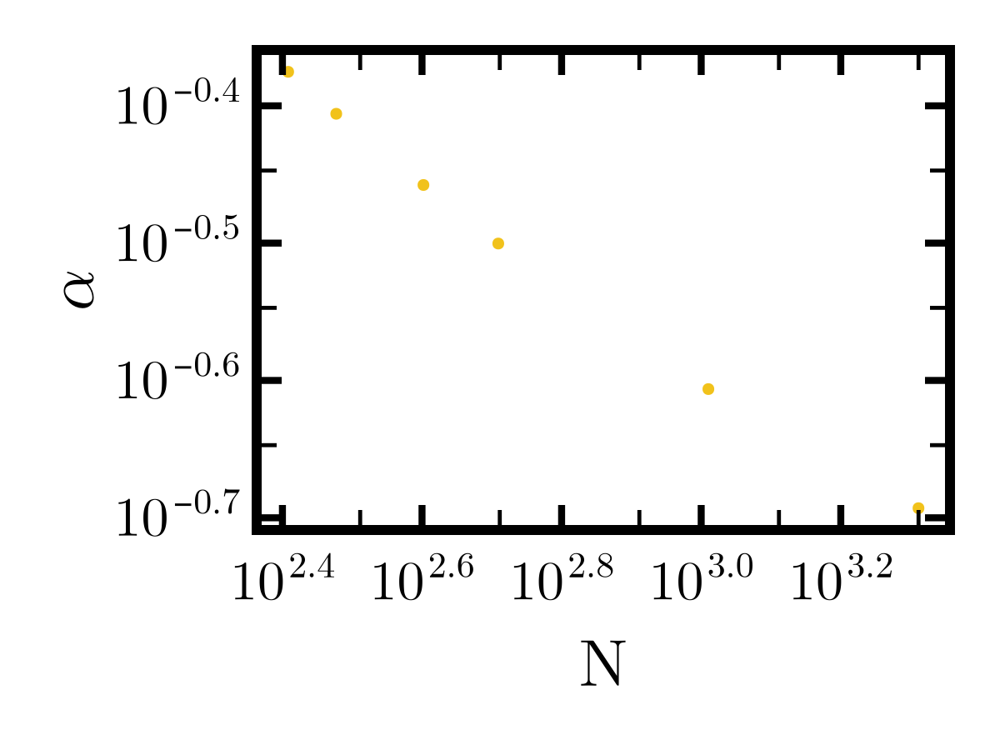

CairoMakie.Screen{IMAGE}


In [ ]:
apply_paper_theme!(
    magnification = 3,
    double_column = false,
    logscale_y = false,
    logscale_x = false,
    )
fig= Figure()
ax = Axis(fig[1,1];
    xlabel = "N",
    ylabel = L"\alpha",
    xscale = log10,
    yscale = log10
    )
scatter!(
    fig[1,1],
    [256, 300, 400, 512, 1024, 2048],
    [abs(fit.params.α) for fit in fit_res_mink_normalized];
    markersize = 10,
    )
display(fig)


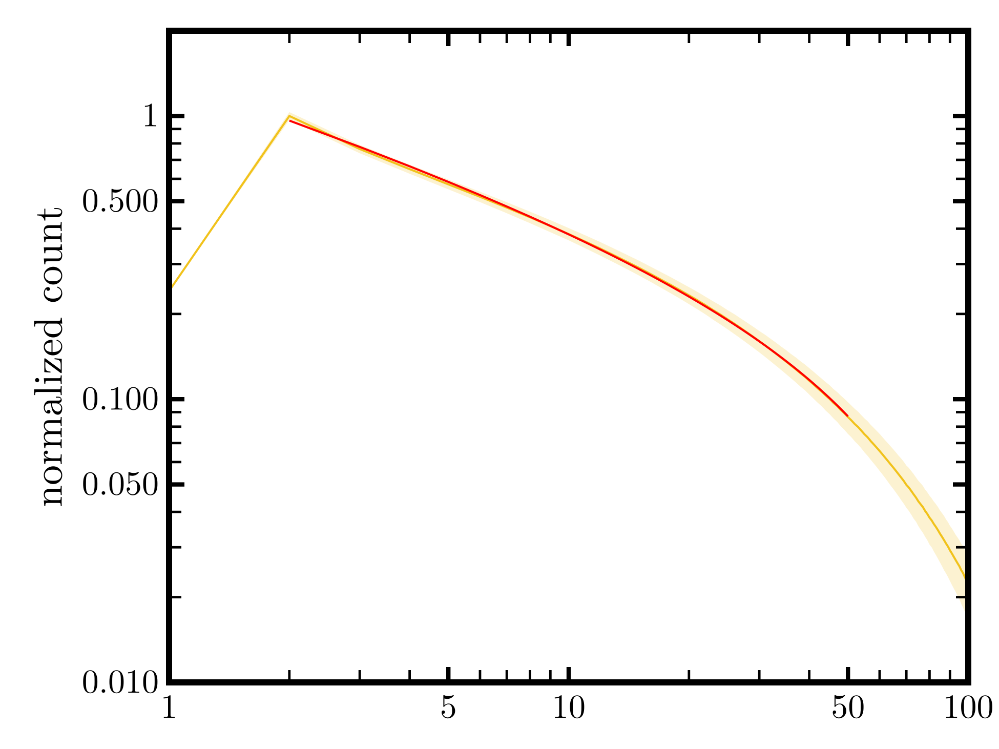

In [ ]:
include("./paper_plot_utils.jl")

fig, ax = plot_mean_histograms_with_std(
    [(average_mink_normalized[1], std_mink_normalized[1])];
ylabel = "normalized count",
return_axis = true,
logscale_x = true,
logscale_y = true,
xlim = (1., 100.),
ylim = (1.e-2, 2.),
magnification = 3,
linewidth = 2
)
lines!(ax, x_mink_normalized[1], fit_res_mink_normalized[1].params.a .+ fit_res_mink_normalized[1].params.b .* x_mink_normalized[1] .^ fit_res_mink_normalized[1].params.α; color = :red, linewidth = 2)
fig

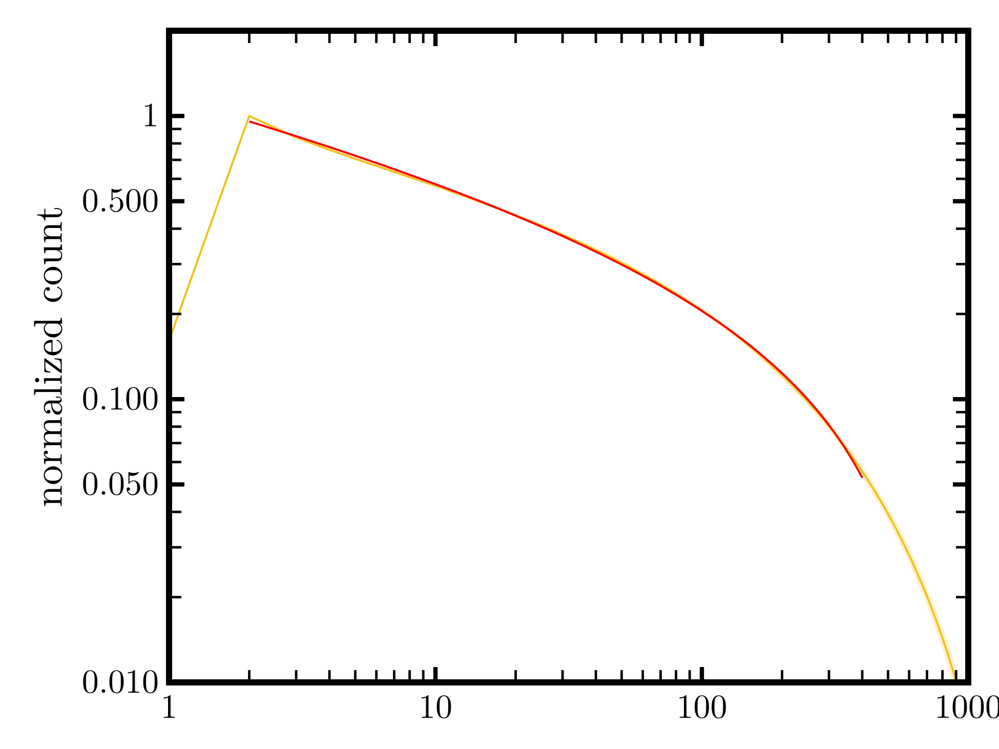

In [ ]:
include("./paper_plot_utils.jl")

fig, ax = plot_mean_histograms_with_std(
    [(average_mink_normalized[end], std_mink_normalized[end])];
ylabel = "normalized count",
return_axis = true,
logscale_x = true,
logscale_y = true,
xlim = (1., 1000.),
ylim = (1.e-2, 2.),
magnification = 3,
linewidth = 2
)
lines!(ax, x_mink_normalized[end], fit_res_mink_normalized[end].params.a .+ fit_res_mink_normalized[end].params.b .* x_mink_normalized[end] .^ fit_res_mink_normalized[end].params.α; color = :red, linewidth = 2)
fig

### Convergence checks

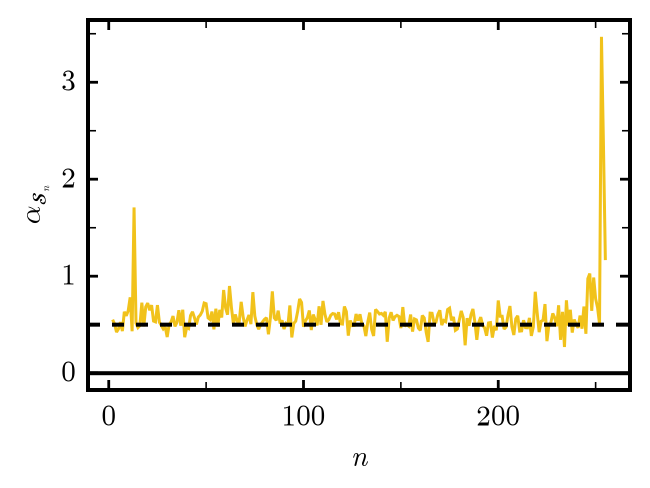

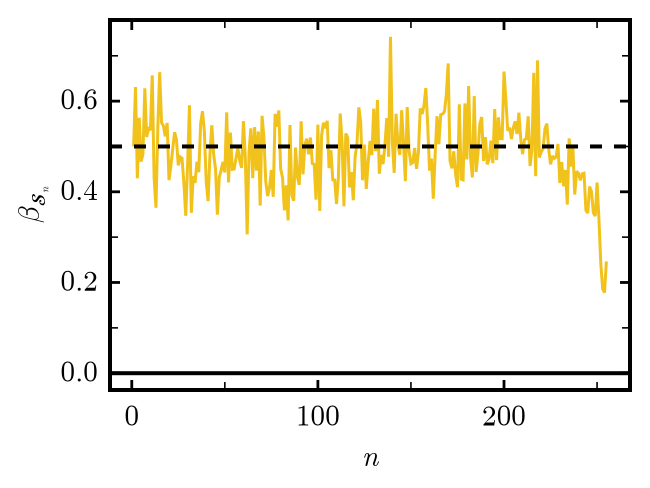

In [94]:
include("./paper_plot_utils.jl")

dense_hists_minkowski_sprinkling = densify_hists(abundance_hists_minkowski_sprinkling[1])

abundances_minkowski_sprinkling_std_exp = plot_alpha_bins(dense_hists_minkowski_sprinkling; 
batchsize = 1,
bin_average = 1,
xlabel = L"n",
ylabel = L"\alpha_{\mathcal{S}_n}",
#bin_plot = 150,
N0 = 1,
magnification = 1)

abundances_minkowski_sprinkling_mean_exp = plot_beta_bins(dense_hists_minkowski_sprinkling; 
batchsize = 1,
bin_average = 1,
xlabel = L"n",
ylabel = L"\beta_{\mathcal{S}_n}",
#bin_plot = 190,
N0 = 1,
magnification = 1)

save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_minkowski_sprinkling_mean_exp.pdf", 
    abundances_minkowski_sprinkling_mean_exp)
save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_minkowski_sprinkling_std_exp.pdf", 
    abundances_minkowski_sprinkling_std_exp)

foreach(display, 
    [abundances_minkowski_sprinkling_std_exp, 
    abundances_minkowski_sprinkling_mean_exp])

## Exact result comparison

In [8]:
data_paths_minkowski_sprinkling_ex_comp = ["/Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_256_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_512_10000/statistics.jld2"]
abundance_hists_minkowski_sprinkling_ex_comp=load_histograms_from_paths(data_paths_minkowski_sprinkling_ex_comp, :cardinalities_hist)

  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_256_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_512_10000/statistics.jld2


2-element Vector{Vector{Dict}}:
 [Dict(56 => 71, 35 => 139, 110 => 18, 60 => 53, 30 => 153, 6 => 516, 67 => 60, 73 => 47, 115 => 11, 153 => 3…), Dict(56 => 85, 35 => 139, 110 => 18, 60 => 66, 30 => 173, 6 => 551, 67 => 55, 215 => 1, 73 => 47, 182 => 1…), Dict(56 => 55, 35 => 155, 110 => 15, 60 => 62, 30 => 185, 6 => 521, 67 => 49, 73 => 46, 182 => 1, 164 => 4…), Dict(56 => 72, 35 => 144, 110 => 16, 60 => 67, 30 => 166, 6 => 567, 67 => 66, 73 => 55, 182 => 2, 164 => 2…), Dict(56 => 68, 35 => 125, 110 => 20, 60 => 52, 30 => 157, 6 => 544, 67 => 53, 73 => 37, 182 => 3, 164 => 2…), Dict(56 => 76, 35 => 127, 110 => 24, 60 => 62, 30 => 173, 6 => 563, 67 => 53, 73 => 41, 182 => 1, 164 => 3…), Dict(56 => 60, 35 => 117, 110 => 15, 60 => 55, 30 => 134, 6 => 574, 67 => 39, 215 => 1, 73 => 38, 182 => 2…), Dict(56 => 61, 35 => 123, 110 => 13, 60 => 54, 30 => 164, 6 => 539, 67 => 41, 73 => 53, 182 => 1, 164 => 2…), Dict(56 => 69, 35 => 137, 110 => 12, 60 => 66, 30 => 172, 6 => 552, 67 => 65, 215 => 

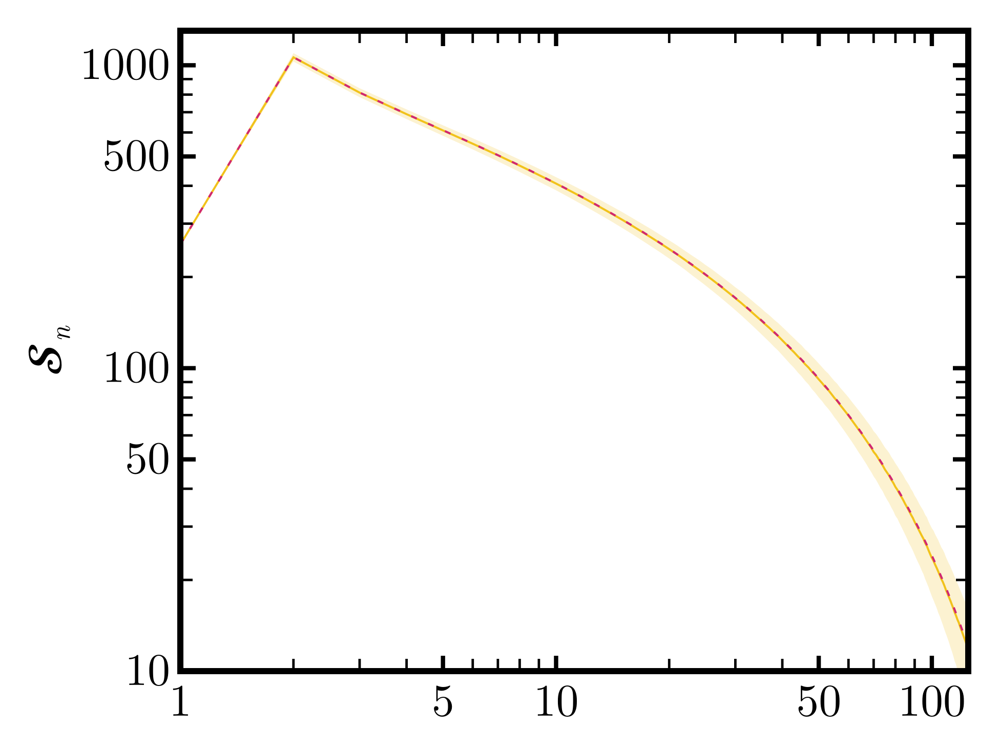

In [68]:
include("./paper_plot_utils.jl")

x_val_mink_ex_comp = 1:256;
average_std_plot_data_minkowski_sprinkling_ex_comp = [average_histogram_with_std(abundance_hists_minkowski_sprinkling_ex_comp[1])]

fig, ax = plot_mean_histograms_with_std(
    average_std_plot_data_minkowski_sprinkling_ex_comp;
    ylabel = L"\mathcal{S}_n",
    return_axis = true,
    logscale_x = true, 
    logscale_y = true,
    xlim = (1., 125.),
    ylim = (1.e1, 1300.),
    magnification = 3,
    linewidth = 2
)
lines!(ax, x_val_mink_ex_comp, [minkowski_interval_abundance_2d_inclusive_asymptotic(x_val, 256) for x_val in x_val_mink_ex_comp]; color = colorant"#D12771", linestyle = (:dash,:loose), linewidth = 2)

save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_comp_analytical_mink.pdf", 
    fig)

fig

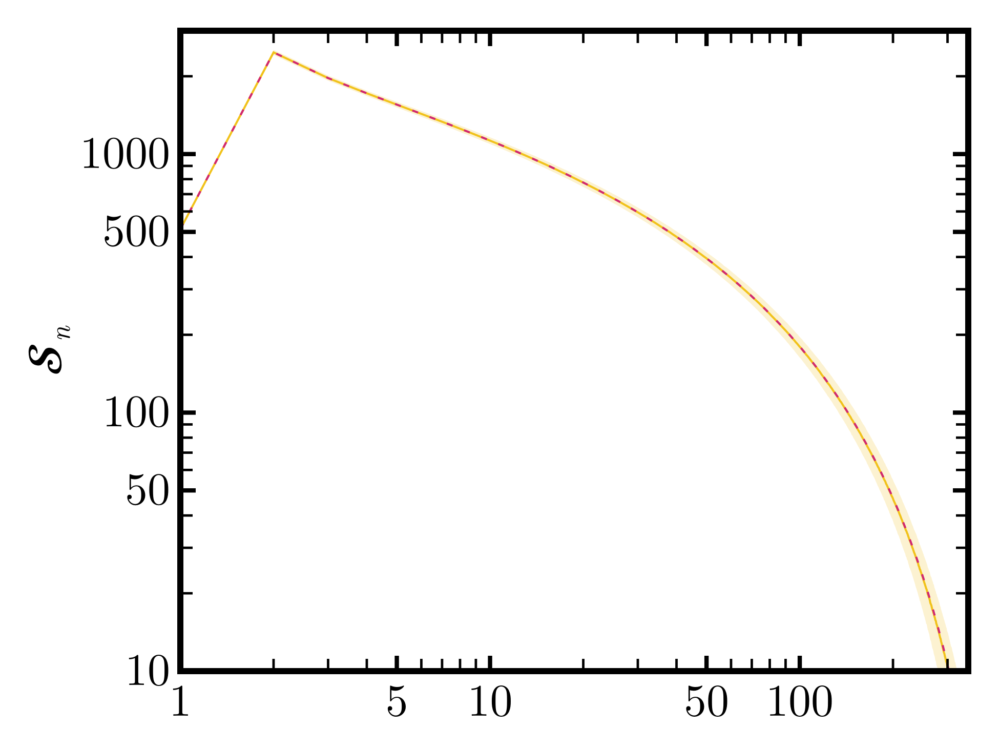

In [42]:
include("./paper_plot_utils.jl")

x_val_mink_ex_comp = 1:512;
average_std_plot_data_minkowski_sprinkling_ex_comp = [average_histogram_with_std(abundance_hists_minkowski_sprinkling_ex_comp[2])]

fig, ax = plot_mean_histograms_with_std(
    average_std_plot_data_minkowski_sprinkling_ex_comp;
    ylabel = L"\mathcal{S}_n",
    return_axis = true,
    logscale_x = true, 
    logscale_y = true,
    xlim = (1., 350.),
    ylim = (1.e1, 3000.),
    magnification = 3,
    linewidth = 2
)
lines!(ax, x_val_mink_ex_comp, [minkowski_interval_abundance_2d_inclusive_asymptotic(x_val, 512) for x_val in x_val_mink_ex_comp]; color = colorant"#D12771", linestyle = (:dash,:loose), linewidth = 2)

fig

## Higher dimension check

In [5]:
data_paths_minkowski_sprinkling_higher_dim = ["/Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_2048_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_3D_2048_10000/statistics.jld2"]
abundance_hists_minkowski_sprinkling_higher_dim=load_histograms_from_paths(data_paths_minkowski_sprinkling_higher_dim, :cardinalities_hist)

  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_2048_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/minkowski_sprinkling_3D_2048_10000/statistics.jld2


2-element Vector{Vector{Dict}}:
 [Dict(1144 => 49, 1175 => 51, 719 => 251, 1546 => 7, 1703 => 5, 1028 => 82, 699 => 284, 831 => 181, 1299 => 32, 1438 => 25…), Dict(1144 => 40, 1175 => 48, 719 => 211, 1546 => 5, 1703 => 5, 1028 => 64, 699 => 236, 831 => 161, 1299 => 22, 1438 => 9…), Dict(1144 => 58, 1175 => 39, 719 => 234, 1546 => 5, 1703 => 3, 1028 => 80, 699 => 231, 831 => 164, 1299 => 30, 1438 => 9…), Dict(1144 => 47, 1175 => 46, 719 => 209, 1546 => 3, 1703 => 2, 1028 => 69, 699 => 256, 831 => 143, 1299 => 22, 1438 => 10…), Dict(1144 => 35, 1175 => 34, 719 => 221, 1546 => 3, 1703 => 1, 1028 => 72, 699 => 230, 831 => 150, 1299 => 22, 1438 => 9…), Dict(1144 => 47, 1175 => 36, 719 => 230, 1546 => 8, 1028 => 77, 699 => 258, 831 => 147, 1299 => 17, 1438 => 13, 1074 => 54…), Dict(1144 => 54, 1175 => 36, 719 => 228, 1546 => 8, 1703 => 1, 1028 => 70, 699 => 240, 831 => 176, 1299 => 23, 1438 => 11…), Dict(1144 => 53, 1175 => 46, 719 => 226, 1546 => 11, 1703 => 1, 1028 => 86, 699 => 269, 831 =

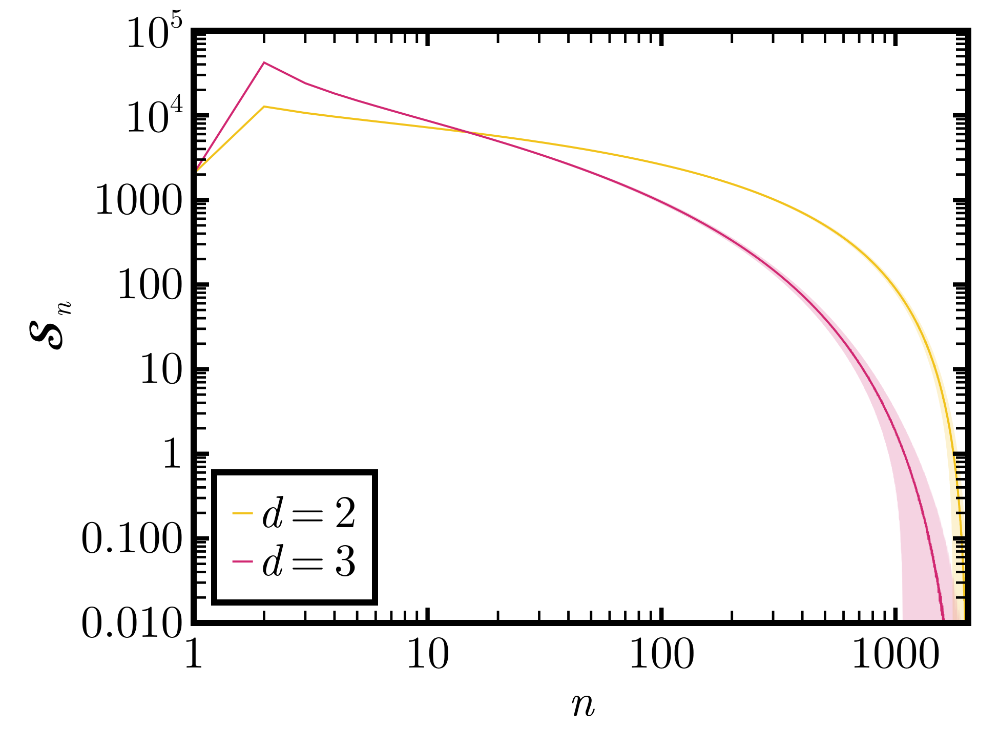

CairoMakie.Screen{PDF}


In [14]:
include("./paper_plot_utils.jl")
average_std_plot_data_minkowski_sprinkling_higher_dim = [average_histogram_with_std(hist) for hist in abundance_hists_minkowski_sprinkling_higher_dim]
fig_minkowski_sprinkling_higher_dim = plot_mean_histograms_with_std(
    average_std_plot_data_minkowski_sprinkling_higher_dim; 
    logscale_x = true, 
    logscale_y = true, 
    xlim = (1., 2048.), 
    ylim = (1.e-2, 10^5.), 
    xlabel = L"n",
    ylabel = L"\mathcal{S}_n", 
    hist_labels = [L"d = 2", L"d = 3"], 
    magnification = 3,
    legendpos = :lb,
    legendmargin = (20,20,20,20),
    #normalize = true,
    linewidth = 2
    )

display(fig_minkowski_sprinkling_higher_dim)
save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_minkowski_sprinkling_higher_dim.pdf", 
    fig_minkowski_sprinkling_higher_dim)

### Convergence checks

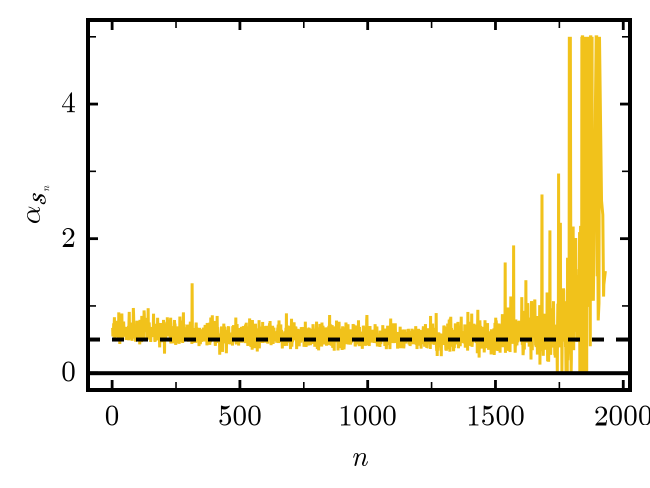

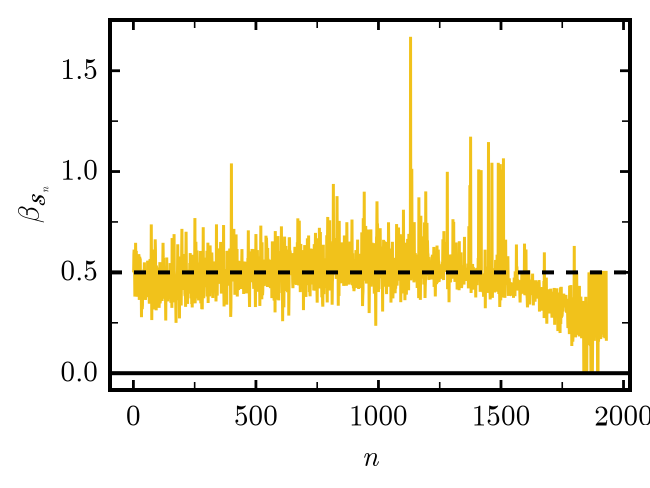

In [15]:
include("./paper_plot_utils.jl")

dense_hists_minkowski_sprinkling_higher_dim = densify_hists(abundance_hists_minkowski_sprinkling_higher_dim[2])

abundances_minkowski_sprinkling_higher_dim_std_exp = plot_alpha_bins(dense_hists_minkowski_sprinkling_higher_dim; 
batchsize = 1,
bin_average = 1,
xlabel = L"n",
ylabel = L"\alpha_{\mathcal{S}_n}",
#bin_plot = 150,
N0 = 1,
magnification = 1)

abundances_minkowski_sprinkling_higher_dim_mean_exp = plot_beta_bins(dense_hists_minkowski_sprinkling_higher_dim; 
batchsize = 1,
bin_average = 1,
xlabel = L"n",
ylabel = L"\beta_{\mathcal{S}_n}",
#bin_plot = 190,
N0 = 1,
magnification = 1)

save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_minkowski_sprinkling_higher_dim_mean_exp.pdf", 
    abundances_minkowski_sprinkling_higher_dim_mean_exp)
save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_minkowski_sprinkling_higher_dim_std_exp.pdf", 
    abundances_minkowski_sprinkling_higher_dim_std_exp)

foreach(display, 
    [abundances_minkowski_sprinkling_higher_dim_std_exp, 
    abundances_minkowski_sprinkling_higher_dim_mean_exp])

# Grids

## Sizes

In [ ]:
data_paths_grid = ["/Volumes/Causal Set Silo/causal_sets/analysis/grid_256_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/grid_512_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/grid_1024_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/grid_2048_10000/statistics.jld2"]
abundance_hists_grid=load_histograms_from_paths(data_paths_grid, :cardinalities_hist)

## Fit oscillations around sprinkling

In [ ]:
include("./paper_plot_utils.jl")
data_paths_comp_quad_grid_man = ["/Volumes/Causal Set Silo/causal_sets/analysis/grid_2048_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_2048_10000/statistics.jld2"]
filters = Vector{Union{Nothing,Function}}([x -> x.lattice == "quadratic" && x.rotation_angle <= 1., nothing])
abundance_hists_comp_quad_grid_man=load_histograms_from_paths(data_paths_comp_quad_grid_man, :cardinalities_hist; filters)

In [ ]:
include("./paper_plot_utils.jl")
average_std_plot_data_comp_quad_grid_man = [average_histogram_with_std(hist) for hist in abundance_hists_comp_quad_grid_man]

### Fourier transform method

In [ ]:
using FFTW
r_comp_quad_grid_man = average_std_plot_data_comp_quad_grid_man[1][1][2:2048] ./ average_std_plot_data_comp_quad_grid_man[2][1][2:2048] .- 1
#r_dev_comp_quad_grid_man = r_comp_quad_grid_man .- Statistics.mean(r_comp_quad_grid_man);
r_dev_fou_comp_quad_grid_man = abs.(fft(r_comp_quad_grid_man))
r_dev_freqs_comp_quad_grid_man = (0:length(r_dev_fou_comp_quad_grid_man)-1) ./ length(r_dev_fou_comp_quad_grid_man)  # cycles per sample
half = 1:(fld(length(r_dev_fou_comp_quad_grid_man),2))          # skip DC at 1
peak_idx = half[argmax(r_dev_fou_comp_quad_grid_man[half])]
f_peak = r_dev_freqs_comp_quad_grid_man[peak_idx]
P_est = 1 / f_peak           # period in “bins”

@show f_peak P_est

k = 5
idxs = sortperm(r_dev_fou_comp_quad_grid_man[half]; rev=true)[1:k]
for i in idxs
    f = r_dev_freqs_comp_quad_grid_man[half[i]]
    A = 2 * abs(r_dev_fou_comp_quad_grid_man[half[i]]) / length(r_comp_quad_grid_man)
    println("f = ", f, "  P ≈ ", 1/f, "  A = ", A)
end

apply_paper_theme!(; magnification = 2)
fig, ax = lines(r_dev_freqs_comp_quad_grid_man[half], r_dev_fou_comp_quad_grid_man[half]; linewidth = 2)
ax.xlabel = "frequency (cycles per bin)"
ax.ylabel = L"\mathcal{F}(\mathcal{S}_n^{\mathrm{grid}} / \mathcal{S}_n^{\mathrm{man}} -1)"

save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/fft_comp_quad_grid_manifoldlike.pdf", 
    fig)

fig

#### Hexagonal

In [ ]:
include("./paper_plot_utils.jl")
data_paths_comp_hex_grid_man = ["/Volumes/Causal Set Silo/causal_sets/analysis/grid_2048_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_2048_10000/statistics.jld2"]
filters = Vector{Union{Nothing,Function}}([x -> x.lattice == "hexagonal" && x.rotation_angle <= 1. && abs(x.segment_ratio - 1) <= .3, nothing])
abundance_hists_comp_hex_grid_man=load_histograms_from_paths(data_paths_comp_hex_grid_man, :cardinalities_hist; filters)
average_std_plot_data_comp_hex_grid_man = [average_histogram_with_std(hist) for hist in abundance_hists_comp_hex_grid_man]

  Loaded 1 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/grid_256_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_256_10000/statistics.jld2


2-element Vector{Tuple{Vector{Float64}, Vector{Float64}}}:
 ([256.0, 1365.0, 584.0, 911.0, 402.0, 510.0, 50.0, 1500.0, 116.0, 125.0  …  8.0, 5.0, 2.0, 1.0, 4.0, 6.0, 2.0, 4.0, 4.0, 1.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0])
 ([256.0, 999.9483, 766.0715, 653.1795, 581.21, 528.2732, 487.2496, 453.9991, 425.5129, 401.1815  …  0.0001, 0.0002, 0.0003, 0.0002, 0.0002, 0.0001, 0.0002, 0.0, 0.0, 0.0002], [0.0, 46.30170652481378, 39.302452693819454, 35.80504265812309, 33.860045776696076, 32.26847938406777, 30.831602291156067, 29.70244601358635, 29.247441487931937, 28.295567811054337  …  0.009999499987499376, 0.019998999974998752, 0.029998499962498124, 0.019998999974998752, 0.019998999974998752, 0.009999499987499376, 0.019998999974998752, 0.0, 0.0, 0.019998999974998752])

f_peak = 0.0
P_est = Inf
f = 0.0  P ≈ Inf  A = 0.8332922632380253
f = 0.008849557522123894  P ≈ 113.0  A = 0.41700726713792735
f = 0.13274336283185842  P ≈ 7.533333333333332  A = 0.2625994162895467
f = 0.4336283185840708  P ≈ 2.306122448979592  A = 0.2497700169828742
f = 0.017699115044247787  P ≈ 56.5  A = 0.24837950755810922


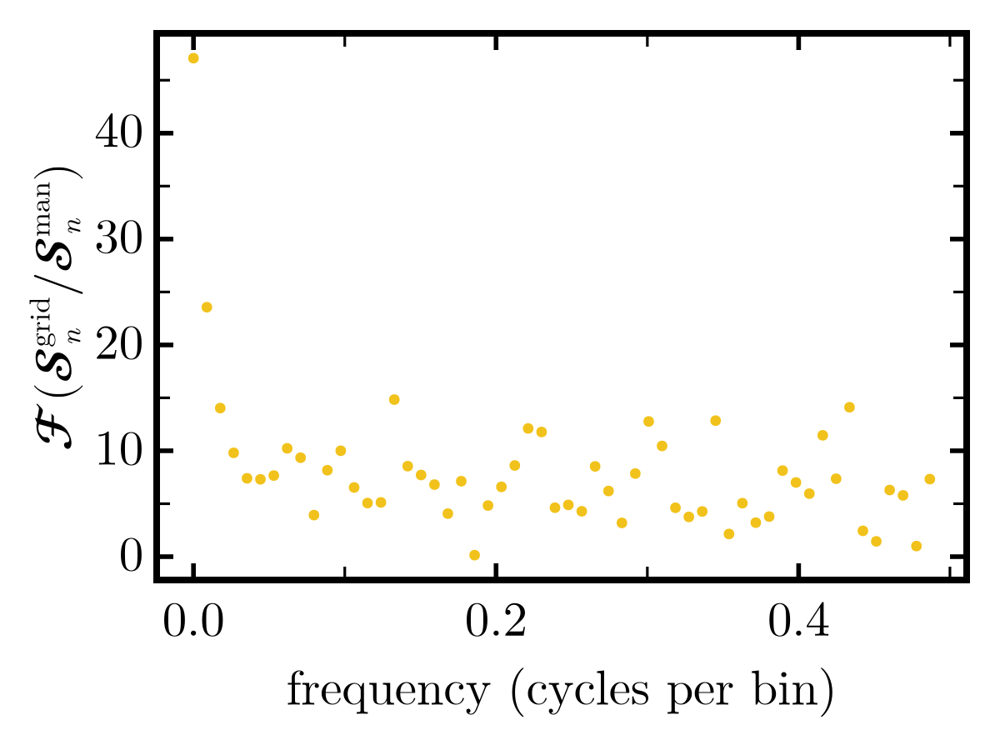

In [124]:
using FFTW
r_comp_hex_grid_man = average_std_plot_data_comp_hex_grid_man[1][1][2:114] ./ average_std_plot_data_comp_hex_grid_man[2][1][2:114] .- 1
#r_dev_comp_hex_grid_man = r_comp_hex_grid_man .- Statistics.mean(r_comp_hex_grid_man);
r_dev_fou_comp_hex_grid_man = abs.(fft(r_comp_hex_grid_man))
r_dev_freqs_comp_hex_grid_man = (0:length(r_dev_fou_comp_hex_grid_man)-1) ./ length(r_dev_fou_comp_hex_grid_man)  # cycles per sample
half = 1:(fld(length(r_dev_fou_comp_hex_grid_man),2))          # skip DC at 1
peak_idx = half[argmax(r_dev_fou_comp_hex_grid_man[half])]
f_peak = r_dev_freqs_comp_hex_grid_man[peak_idx]
P_est = 1 / f_peak           # period in “bins”

@show f_peak P_est

k = 5
idxs = sortperm(r_dev_fou_comp_hex_grid_man[half]; rev=true)[1:k]
for i in idxs
    f = r_dev_freqs_comp_hex_grid_man[half[i]]
    A = 2 * abs(r_dev_fou_comp_hex_grid_man[half[i]]) / length(r_comp_hex_grid_man)
    println("f = ", f, "  P ≈ ", 1/f, "  A = ", A)
end

apply_paper_theme!(; magnification = 2)
fig, ax = scatter(r_dev_freqs_comp_hex_grid_man[half], r_dev_fou_comp_hex_grid_man[half])
ax.xlabel = "frequency (cycles per bin)"
ax.ylabel = L"\mathcal{F}(\mathcal{S}_n^{\mathrm{grid}} / \mathcal{S}_n^{\mathrm{man}})"
fig

### Rectangular

In [142]:
include("./paper_plot_utils.jl")
data_paths_comp_rect_grid_man = ["/Volumes/Causal Set Silo/causal_sets/analysis/grid_256_10000/statistics.jld2", "/Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_256_10000/statistics.jld2"]
filters = Vector{Union{Nothing,Function}}([x -> x.lattice == "rectangular" && x.rotation_angle <= 1. && abs(x.segment_ratio - 5) <= .3, nothing])
abundance_hists_comp_rect_grid_man=load_histograms_from_paths(data_paths_comp_rect_grid_man, :cardinalities_hist; filters)
average_std_plot_data_comp_rect_grid_man = [average_histogram_with_std(hist) for hist in abundance_hists_comp_rect_grid_man]

  Loaded 1 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/grid_256_10000/statistics.jld2
  Loaded 10000 histograms from /Volumes/Causal Set Silo/causal_sets/analysis/manifoldlike_simply_connected_256_10000/statistics.jld2


2-element Vector{Tuple{Vector{Float64}, Vector{Float64}}}:
 ([256.0, 570.0, 392.0, 534.0, 192.0, 586.0, 160.0, 384.0, 240.0, 322.0  …  56.0, 64.0, 0.0, 44.0, 4.0, 26.0, 28.0, 0.0, 0.0, 14.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0])
 ([256.0, 999.9483, 766.0715, 653.1795, 581.21, 528.2732, 487.2496, 453.9991, 425.5129, 401.1815  …  0.0001, 0.0002, 0.0003, 0.0002, 0.0002, 0.0001, 0.0002, 0.0, 0.0, 0.0002], [0.0, 46.30170652481378, 39.302452693819454, 35.80504265812309, 33.860045776696076, 32.26847938406777, 30.831602291156067, 29.70244601358635, 29.247441487931937, 28.295567811054337  …  0.009999499987499376, 0.019998999974998752, 0.029998499962498124, 0.019998999974998752, 0.019998999974998752, 0.009999499987499376, 0.019998999974998752, 0.0, 0.0, 0.019998999974998752])

f_peak = 0.0
P_est = Inf
f = 0.0  P ≈ Inf  A = 1.2873733386955788
f = 0.037037037037037035  P ≈ 27.0  A = 0.2837318802584005
f = 0.07407407407407407  P ≈ 13.5  A = 0.12688396485786818
f = 0.2962962962962963  P ≈ 3.375  A = 0.09843002740753226
f = 0.3333333333333333  P ≈ 3.0  A = 0.08046827693610997


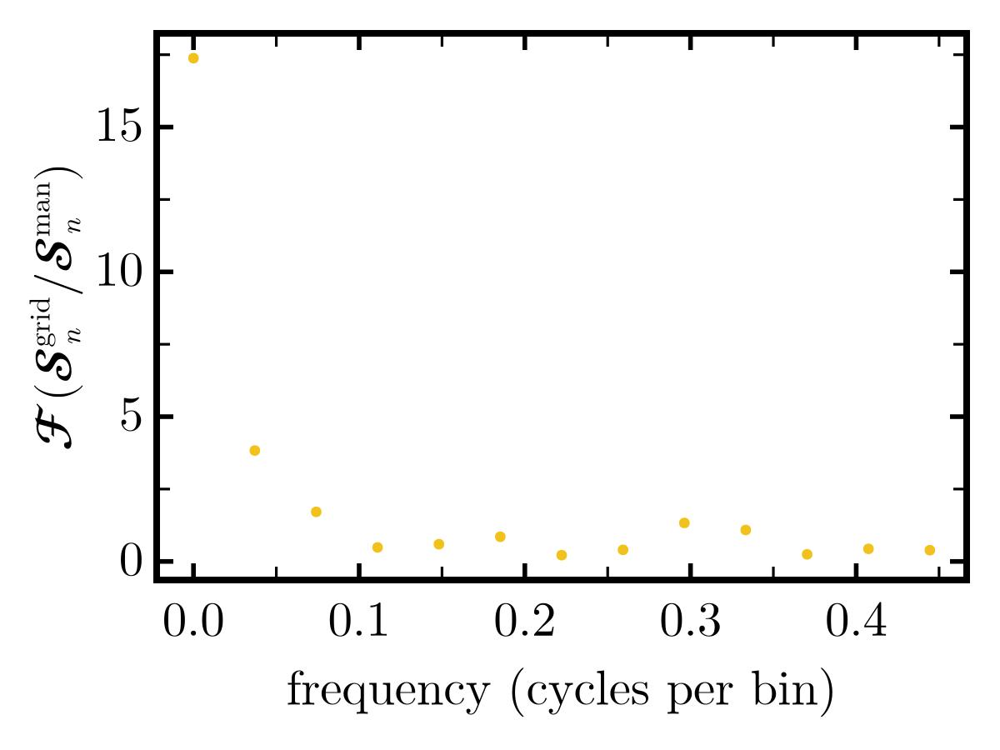

In [144]:
using FFTW
r_comp_rect_grid_man = average_std_plot_data_comp_rect_grid_man[1][1][2:28] ./ average_std_plot_data_comp_rect_grid_man[2][1][2:28] .- 1
#r_dev_comp_rect_grid_man = r_comp_rect_grid_man .- Statistics.mean(r_comp_rect_grid_man);
r_dev_fou_comp_rect_grid_man = abs.(fft(r_comp_rect_grid_man))
r_dev_freqs_comp_rect_grid_man = (0:length(r_dev_fou_comp_rect_grid_man)-1) ./ length(r_dev_fou_comp_rect_grid_man)  # cycles per sample
half = 1:(fld(length(r_dev_fou_comp_rect_grid_man),2))          # skip DC at 1
peak_idx = half[argmax(r_dev_fou_comp_rect_grid_man[half])]
f_peak = r_dev_freqs_comp_rect_grid_man[peak_idx]
P_est = 1 / f_peak           # period in “bins”

@show f_peak P_est

k = 5
idxs = sortperm(r_dev_fou_comp_rect_grid_man[half]; rev=true)[1:k]
for i in idxs
    f = r_dev_freqs_comp_rect_grid_man[half[i]]
    A = 2 * abs(r_dev_fou_comp_rect_grid_man[half[i]]) / length(r_comp_rect_grid_man)
    println("f = ", f, "  P ≈ ", 1/f, "  A = ", A)
end

apply_paper_theme!(; magnification = 2)
fig, ax = scatter(r_dev_freqs_comp_rect_grid_man[half], r_dev_fou_comp_rect_grid_man[half])
ax.xlabel = "frequency (cycles per bin)"
ax.ylabel = L"\mathcal{F}(\mathcal{S}_n^{\mathrm{grid}} / \mathcal{S}_n^{\mathrm{man}})"
fig

### Fit with period fixed to 4

multistart 1: χ² = 14.664660775175388 (best = 14.664660775175388)
multistart 10: χ² = 79.72040593272202 (best = 14.664660775175388)
multistart 20: χ² = 79.72043188647925 (best = 8.443101246749817)
multistart 30: χ² = 79.7204064411517 (best = 8.443101246749817)
multistart 40: χ² = 79.72040608095308 (best = 8.144792593206422)
multistart 50: χ² = 79.72040589109203 (best = 8.144792593206422)
multistart 60: χ² = 79.72040685216548 (best = 5.89556975994311)
multistart 70: χ² = 79.72040705670702 (best = 5.89556975994311)
multistart 80: χ² = 79.72040600002484 (best = 5.89556975994311)
multistart 90: χ² = 79.72040595959507 (best = 5.89556975994311)
multistart 100: χ² = 16.702599010226567 (best = 5.89556975994311)
multistart done: best χ² = 5.89556975994311
(a0 = 1.1700090681420603, a1 = 0.40029082243119607, ϕ1 = 2.6509710530799913, P1 = 1.9840959366888864, a2 = 0.3156924893303947, ϕ2 = -1.037836956251863, P2 = 2.6621039067583534)
χ²: 5.89556975994311


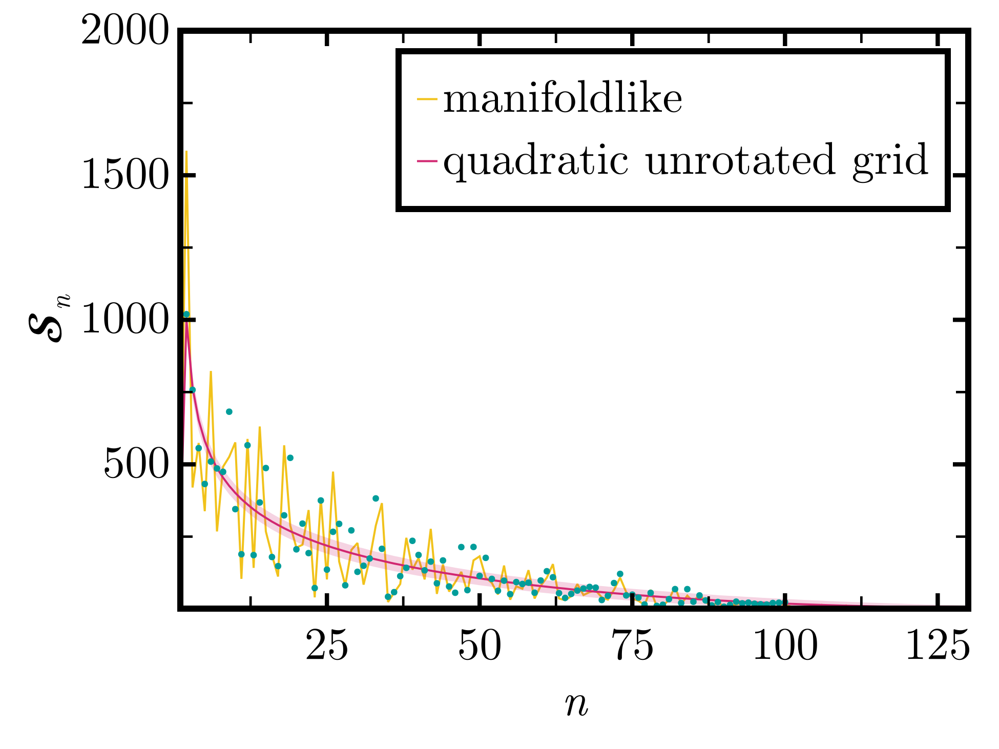

In [94]:
include("./paper_plot_utils.jl")

fit_end = 100
multistart = 100
K = 2

xs = collect(2:fit_end)
base = average_std_plot_data_comp_quad_grid_man[1][1]
ys = average_std_plot_data_comp_quad_grid_man[2][1]
σs = average_std_plot_data_comp_quad_grid_man[2][2]

function make_F(K)
    ex = :(p.a0)
    for i in 1:K
        ai = Symbol("a$i")
        ϕi = Symbol("ϕ$i")
        Pi = Symbol("P$i")
        ex = :($ex +
               p.$ai * cos($(2π*i) * x / p.$Pi + p.$ϕi)
        )
    end
    return :( (x, p) -> $ex )
end

amps = [.8^n for n in 1:K]  # length K
syms = foldl((acc, i) -> (acc..., Symbol("a$i"), Symbol("ϕ$i"), Symbol("P$i")), 1:K; init = (:a0,))

vals = Any[1.0]  # a0
for i in 1:K
    push!(vals, amps[i], Float64(π/2), 3.0)  # a_i, ϕ_i, P _i
end

init = NamedTuple{syms}(Tuple(vals))

let F = eval(make_F(K))

    param_syms = foldl((acc, i) -> (acc..., Symbol("a$i"), Symbol("ϕ$i"), Symbol("P$i")),
                    1:K; init = (:a0,))


    model = (x, p) -> base[x] * F(x, p)

    std_fn = (ys, preds, σ, p) -> abs.(F.(xs, Ref(p))) .* σ  # σ scaled by oscillatory factor

    params, res, χ² = fit_histogram_bins(
        ys,
        model,
        param_syms,
        2,
        fit_end;
        stds = σs,
        std_fn = std_fn,
        init = init,
        minimize_χ² = true,
        goodness_of_fit = true,
        multistart = multistart,
        #rng = MersenneTwister(42322),
        verbose = true,
        method = Optim.BFGS(),
        autodiff = AutoForwardDiff()
    )

    println(params)
    println("χ²: ", χ²)

    fig, ax = plot_mean_histograms_with_std(
        average_std_plot_data_comp_quad_grid_man;
        logscale_x = false,
        logscale_y = false,
        xlim = (1., 130.),
        ylim = (1.e0, 2000.),
        xlabel = L"n",
        ylabel = L"\mathcal{S}_n",
        hist_labels = ["manifoldlike", "quadratic unrotated grid"],
        magnification = 3,
        legendpos = :rt,
        legendmargin = (20,20,20,20),
        linewidth = 2,
        return_axis = true,
    )

    scatter!(ax, xs, ys[xs] ./ F.(xs, Ref(params));
        color = colorant"#009D9A")

    save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_comp_quad_grid_man_fit.pdf", 
        fig)

    fig, ax = plot_mean_histograms_with_std(
        average_std_plot_data_comp_quad_grid_man;
        logscale_x = false,
        logscale_y = false,
        xlim = (1., 130.),
        ylim = (1.e0, 2000.),
        xlabel = L"n",
        ylabel = L"\mathcal{S}_n",
        hist_labels = ["manifoldlike", "quadratic unrotated grid"],
        magnification = 3,
        legendpos = :rt,
        legendmargin = (20,20,20,20),
        linewidth = 2,
        return_axis = true,
    )

    scatter!(ax, xs, base[xs] .* F.(xs, Ref(params));
        color = colorant"#009D9A")

    save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_comp_quad_grid_man_fit_2.pdf", 
        fig)

    fig
end

multistart 1: χ² = 78.02422704044804 (best = 78.02422704044804)
multistart 10: χ² = 78.02417507951941 (best = 6.062032139345865)
multistart 20: χ² = 78.02422704044807 (best = 6.062032139345865)
multistart 30: χ² = 6.062032139345875 (best = 6.062032139345865)
multistart 40: χ² = 78.02422704044805 (best = 6.062032139345865)
multistart 50: χ² = 18.701755966461256 (best = 6.062032139345865)
multistart 60: χ² = 11.098946601705501 (best = 6.0620321393458605)
multistart 70: χ² = 6.062032139345887 (best = 6.0620321393458605)
multistart 80: χ² = 78.02417091966942 (best = 6.0620321393458605)
multistart 90: χ² = 70.42142984067726 (best = 6.062032139345854)
multistart 100: χ² = 78.02422704044807 (best = 6.062032139345854)
multistart done: best χ² = 6.062032139345854
(a0 = 1.1634758708838357, a1 = 0.1935792136201853, b1 = -0.22000393085947753, a2 = -0.3582915253471536, b2 = 0.10044345630081383)
χ²: 6.062032139345854


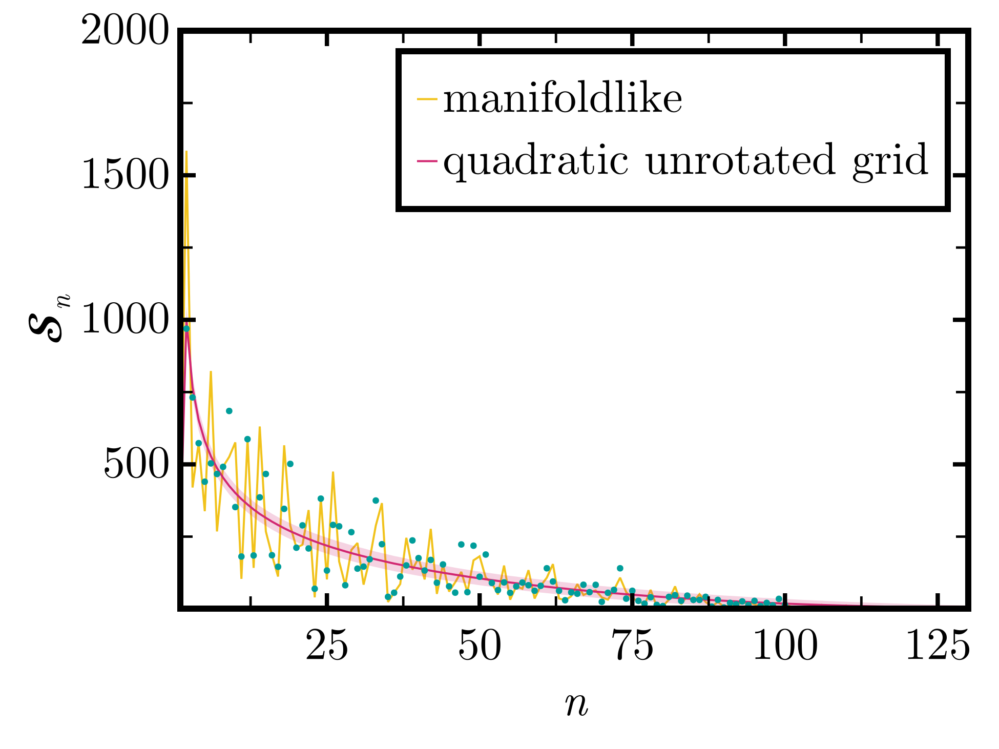

In [89]:
include("./paper_plot_utils.jl")

fit_end = 100
multistart = 100
K = 2

xs = collect(2:fit_end)
base = average_std_plot_data_comp_quad_grid_man[1][1]
ys = average_std_plot_data_comp_quad_grid_man[2][1]
σs = average_std_plot_data_comp_quad_grid_man[2][2]

function make_F(K)
    ex = :(p.a0)
    for i in 1:K
        ai = Symbol("a$i")
        bi = Symbol("b$i")
        ex = :($ex +
               p.$ai * cos($(2π*i) * x / 4) +
               p.$bi * sin($(2π*i) * x / 4))
    end
    return :( (x, p) -> $ex )
end

amps = [.8^n for n in 1:K]  # length K
syms = foldl((acc, i) -> (acc..., Symbol("a$i"), Symbol("b$i")), 1:K; init = (:a0,))

vals = Any[1.0]  # a0
for i in 1:K
    push!(vals, amps[i], amps[i])  # a_i, b_i
end

init = NamedTuple{syms}(Tuple(vals))

let F = eval(make_F(K))

    param_syms = foldl((acc, i) -> (acc..., Symbol("a$i"), Symbol("b$i")),
                    1:K; init = (:a0,))


    model = (x, p) -> base[x] * F(x, p)

    std_fn = (ys, preds, σ, p) -> abs.(F.(xs, Ref(p))) .* σ  # σ scaled by oscillatory factor

    params, res, χ² = fit_histogram_bins(
        ys,
        model,
        param_syms,
        2,
        fit_end;
        stds = σs,
        std_fn = std_fn,
        init = init,
        minimize_χ² = true,
        goodness_of_fit = true,
        multistart = multistart,
        #rng = MersenneTwister(42322),
        verbose = true,
        method = Optim.BFGS(),
        autodiff = AutoForwardDiff()
    )

    println(params)
    println("χ²: ", χ²)

    fig, ax = plot_mean_histograms_with_std(
        average_std_plot_data_comp_quad_grid_man;
        logscale_x = false,
        logscale_y = false,
        xlim = (1., 130.),
        ylim = (1.e0, 2000.),
        xlabel = L"n",
        ylabel = L"\mathcal{S}_n",
        hist_labels = ["manifoldlike", "quadratic unrotated grid"],
        magnification = 3,
        legendpos = :rt,
        legendmargin = (20,20,20,20),
        linewidth = 2,
        return_axis = true,
    )

    scatter!(ax, xs, ys[xs] ./ F.(xs, Ref(params));
        color = colorant"#009D9A")

    save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_comp_quad_grid_man_fit.pdf", 
        fig)

    fig, ax = plot_mean_histograms_with_std(
        average_std_plot_data_comp_quad_grid_man;
        logscale_x = false,
        logscale_y = false,
        xlim = (1., 130.),
        ylim = (1.e0, 2000.),
        xlabel = L"n",
        ylabel = L"\mathcal{S}_n",
        hist_labels = ["manifoldlike", "quadratic unrotated grid"],
        magnification = 3,
        legendpos = :rt,
        legendmargin = (20,20,20,20),
        linewidth = 2,
        return_axis = true,
    )

    scatter!(ax, xs, base[xs] .* F.(xs, Ref(params));
        color = colorant"#009D9A")

    save("/Users/fabian/Desktop/Local Calculations/git_projects/Causal Sets/QuantumGrav-usage/data/abundances_comp_quad_grid_man_fit_2.pdf", 
        fig)

    fig
end

### Over-fit

(P = 1.7123775564518717, a0 = 1.2519869127067693, a1 = -0.24036022985267494, b1 = 0.02846704495967053, a2 = 0.16973792006748042, b2 = -0.18786860027345437, a3 = 0.1318880257142514, b3 = 0.3854160447718059, a4 = -0.29854150838064764, b4 = -0.13205730661175372, a5 = 0.08776690810252963, b5 = -0.011183805370843071, a6 = -0.45925313926466965, b6 = -0.09257024489281941)
χ²: 3.833782842246235


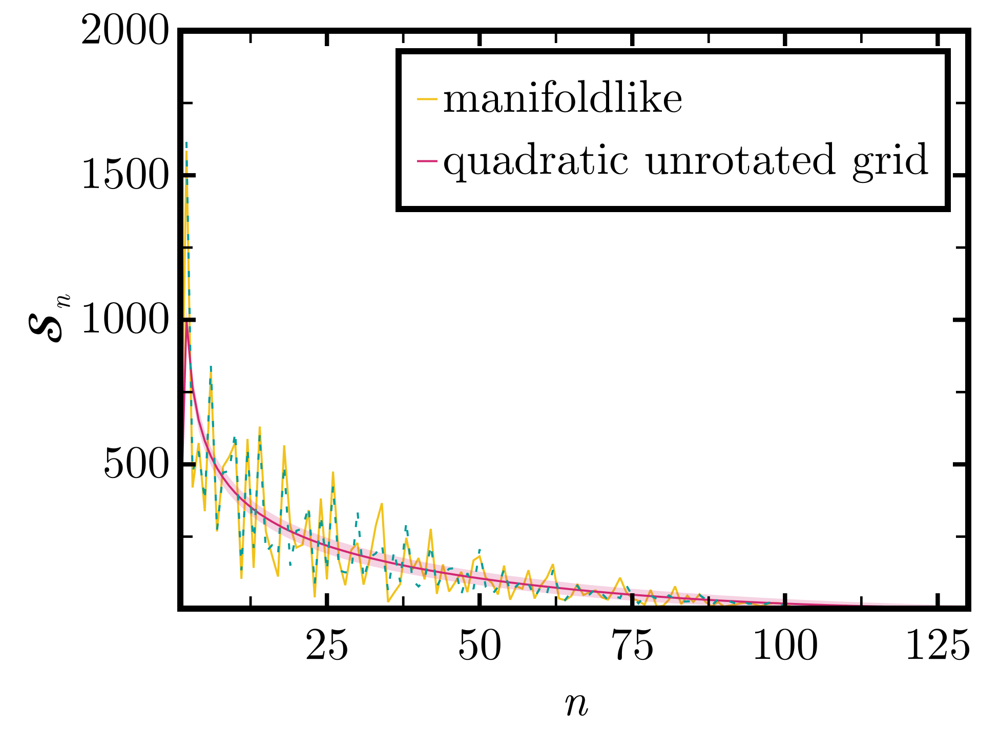

In [10]:
include("./paper_plot_utils.jl")

fit_end = 100
multistart = 100000
K = 6

xs = collect(2:fit_end)
base = average_std_plot_data_comp_quad_grid_man[1][1]
ys = average_std_plot_data_comp_quad_grid_man[2][1]
σs = average_std_plot_data_comp_quad_grid_man[2][2]

function make_F(K)
    ex = :(p.a0)
    for i in 1:K
        ai = Symbol("a$i")
        bi = Symbol("b$i")
        ex = :($ex +
               p.$ai * cos($(2π*i) * x / p.P) +
               p.$bi * sin($(2π*i) * x / p.P))
    end
    return :( (x, p) -> $ex )
end

amps = [.8^n for n in 1:K]  # length K
syms = foldl((acc, i) -> (acc..., Symbol("a$i"), Symbol("b$i")), 1:K; init = (:a0,))

vals = Any[1.0]  # a0
for i in 1:K
    push!(vals, amps[i], amps[i])  # a_i, b_i
end

init = NamedTuple{(syms..., :P)}((vals..., 3.0))

let F = eval(make_F(K))

    param_syms = foldl((acc, i) -> (acc..., Symbol("a$i"), Symbol("b$i")),
                    1:K; init = (:P, :a0))


    model = (x, p) -> base[x] * F(x, p)

    std_fn = (ys, preds, σ, p) -> abs.(F.(xs, Ref(p))) .* σ  # σ scaled by oscillatory factor

    params, res, χ² = fit_histogram_bins(
        ys,
        model,
        param_syms,
        2,
        fit_end;
        stds = σs,
        std_fn = std_fn,
        init = init,
        minimize_χ² = true,
        goodness_of_fit = true,
        multistart = multistart,
        #rng = MersenneTwister(42322),
        verbose = false,
        method = Optim.BFGS(),
        autodiff = AutoForwardDiff()
    )

    println(params)
    println("χ²: ", χ²)

    fig, ax = plot_mean_histograms_with_std(
        average_std_plot_data_comp_quad_grid_man;
        logscale_x = false,
        logscale_y = false,
        xlim = (1., 130.),
        ylim = (1.e0, 2000.),
        xlabel = L"n",
        ylabel = L"\mathcal{S}_n",
        hist_labels = ["manifoldlike", "quadratic unrotated grid"],
        magnification = 3,
        legendpos = :rt,
        legendmargin = (20,20,20,20),
        linewidth = 2,
        return_axis = true,
    )

    lines!(ax, xs, ys[xs] ./ F.(xs, Ref(params));
        color = colorant"#009D9A", linestyle = (:dash, :loose), linewidth = 2)
    fig
end

(P = 0.1445641740679614, a0 = 1.2372989010671924, a1 = 0.0677700800898942, b1 = -0.054192760241445946, a2 = 0.06856740209983403, b2 = 0.27929439235244846, a3 = 0.11902123384943317, b3 = 0.3441634836078867, a4 = -0.30124303504215294, b4 = 0.07565806826003933, a5 = -0.06331137475546321, b5 = 0.03748698207000354, a6 = -0.40586087982087454, b6 = -0.21941462568884768, a7 = -0.19514376127044752, b7 = 0.003687543569764806)
χ²: 3.7968433833699327


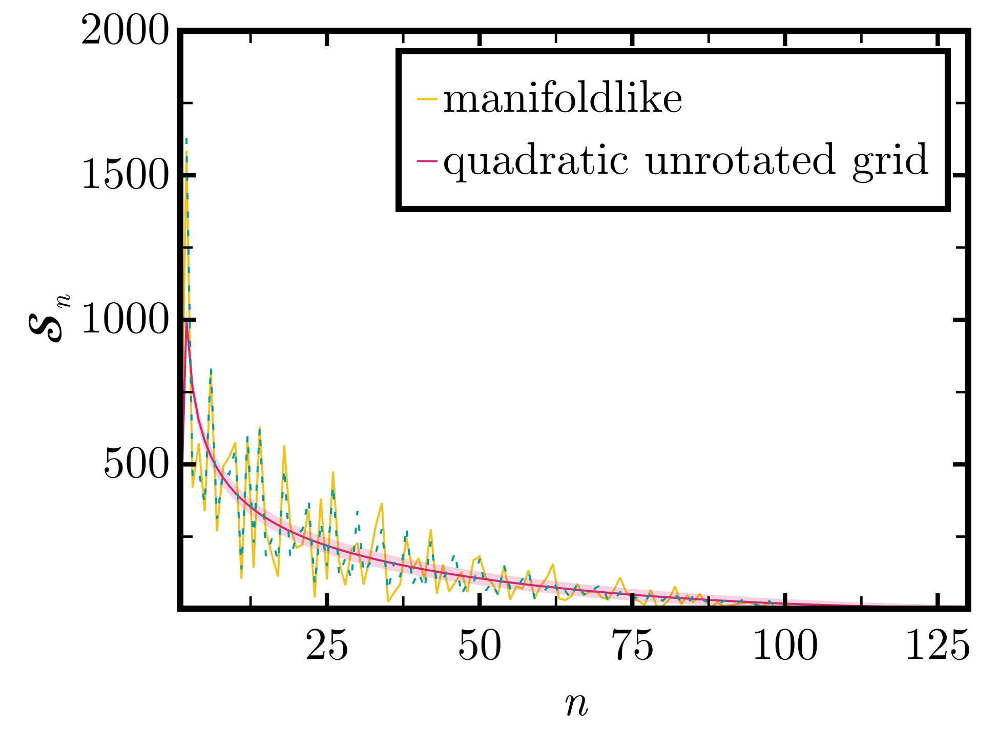

In [11]:
include("./paper_plot_utils.jl")

fit_end = 100
multistart = 100000
K = 7

xs = collect(2:fit_end)
base = average_std_plot_data_comp_quad_grid_man[1][1]
ys = average_std_plot_data_comp_quad_grid_man[2][1]
σs = average_std_plot_data_comp_quad_grid_man[2][2]

function make_F(K)
    ex = :(p.a0)
    for i in 1:K
        ai = Symbol("a$i")
        bi = Symbol("b$i")
        ex = :($ex +
               p.$ai * cos($(2π*i) * x / p.P) +
               p.$bi * sin($(2π*i) * x / p.P))
    end
    return :( (x, p) -> $ex )
end

amps = [.8^n for n in 1:K]  # length K
syms = foldl((acc, i) -> (acc..., Symbol("a$i"), Symbol("b$i")), 1:K; init = (:a0,))

vals = Any[1.0]  # a0
for i in 1:K
    push!(vals, amps[i], amps[i])  # a_i, b_i
end

init = NamedTuple{(syms..., :P)}((vals..., 3.0))

let F = eval(make_F(K))

    param_syms = foldl((acc, i) -> (acc..., Symbol("a$i"), Symbol("b$i")),
                    1:K; init = (:P, :a0))


    model = (x, p) -> base[x] * F(x, p)

    std_fn = (ys, preds, σ, p) -> abs.(F.(xs, Ref(p))) .* σ  # σ scaled by oscillatory factor

    params, res, χ² = fit_histogram_bins(
        ys,
        model,
        param_syms,
        2,
        fit_end;
        stds = σs,
        std_fn = std_fn,
        init = init,
        minimize_χ² = true,
        goodness_of_fit = true,
        multistart = multistart,
        #rng = MersenneTwister(42322),
        verbose = false,
        method = Optim.BFGS(),
        autodiff = AutoForwardDiff()
    )

    println(params)
    println("χ²: ", χ²)

    fig, ax = plot_mean_histograms_with_std(
        average_std_plot_data_comp_quad_grid_man;
        logscale_x = false,
        logscale_y = false,
        xlim = (1., 130.),
        ylim = (1.e0, 2000.),
        xlabel = L"n",
        ylabel = L"\mathcal{S}_n",
        hist_labels = ["manifoldlike", "quadratic unrotated grid"],
        magnification = 3,
        legendpos = :rt,
        legendmargin = (20,20,20,20),
        linewidth = 2,
        return_axis = true,
    )

    lines!(ax, xs, ys[xs] ./ F.(xs, Ref(params));
        color = colorant"#009D9A", linestyle = (:dash, :loose), linewidth = 2)
    fig
end

(P = 1.0901042331063255, a0 = 1.277559584160248, a1 = 0.15943763262624427, b1 = 0.018789086634906155, a2 = 0.16304220169622574, b2 = 0.3249120771295429, a3 = 0.11234178812416752, b3 = 0.4158226284748759, a4 = -0.21393848545402522, b4 = 0.10451884994428498, a5 = -0.22863674409625928, b5 = 0.043756023894213694, a6 = -0.4672551503863221, b6 = -0.17499582217802687, a7 = -0.13274314047682956, b7 = 0.007857521956772069, a8 = -0.16292648793107906, b8 = -0.1222290367924614)
χ²: 3.5342466111619304


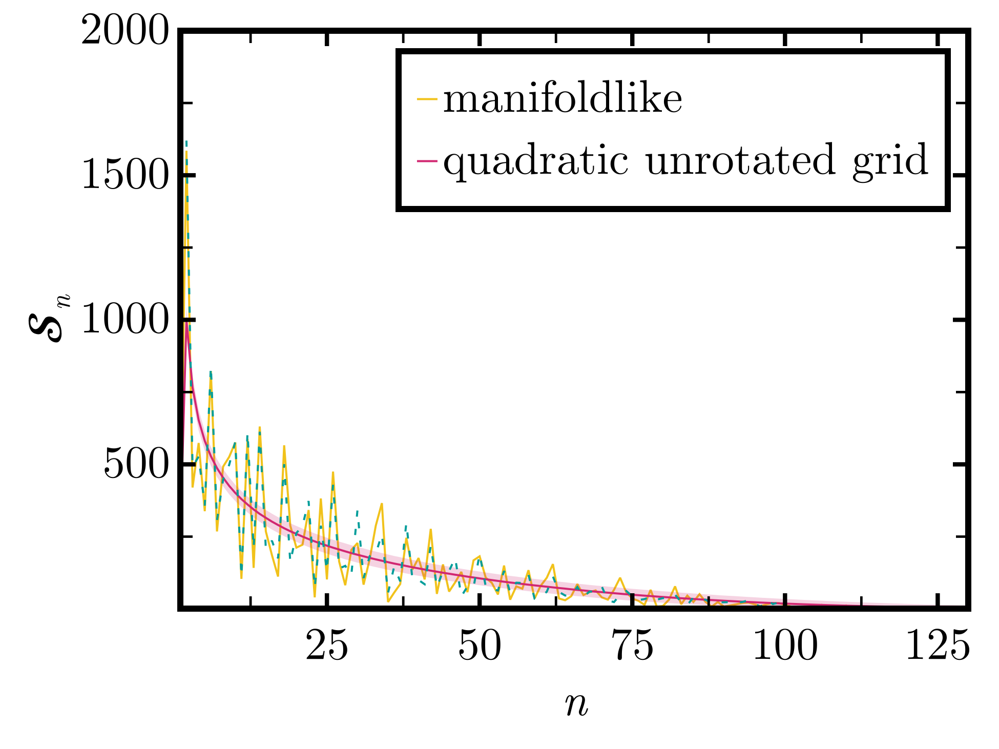

In [12]:
include("./paper_plot_utils.jl")

fit_end = 100
multistart = 100000
K = 8

xs = collect(2:fit_end)
base = average_std_plot_data_comp_quad_grid_man[1][1]
ys = average_std_plot_data_comp_quad_grid_man[2][1]
σs = average_std_plot_data_comp_quad_grid_man[2][2]

function make_F(K)
    ex = :(p.a0)
    for i in 1:K
        ai = Symbol("a$i")
        bi = Symbol("b$i")
        ex = :($ex +
               p.$ai * cos($(2π*i) * x / p.P) +
               p.$bi * sin($(2π*i) * x / p.P))
    end
    return :( (x, p) -> $ex )
end

amps = [.8^n for n in 1:K]  # length K
syms = foldl((acc, i) -> (acc..., Symbol("a$i"), Symbol("b$i")), 1:K; init = (:a0,))

vals = Any[1.0]  # a0
for i in 1:K
    push!(vals, amps[i], amps[i])  # a_i, b_i
end

init = NamedTuple{(syms..., :P)}((vals..., 3.0))

let F = eval(make_F(K))

    param_syms = foldl((acc, i) -> (acc..., Symbol("a$i"), Symbol("b$i")),
                    1:K; init = (:P, :a0))


    model = (x, p) -> base[x] * F(x, p)

    std_fn = (ys, preds, σ, p) -> abs.(F.(xs, Ref(p))) .* σ  # σ scaled by oscillatory factor

    params, res, χ² = fit_histogram_bins(
        ys,
        model,
        param_syms,
        2,
        fit_end;
        stds = σs,
        std_fn = std_fn,
        init = init,
        minimize_χ² = true,
        goodness_of_fit = true,
        multistart = multistart,
        #rng = MersenneTwister(42322),
        verbose = false,
        method = Optim.BFGS(),
        autodiff = AutoForwardDiff()
    )

    println(params)
    println("χ²: ", χ²)

    fig, ax = plot_mean_histograms_with_std(
        average_std_plot_data_comp_quad_grid_man;
        logscale_x = false,
        logscale_y = false,
        xlim = (1., 130.),
        ylim = (1.e0, 2000.),
        xlabel = L"n",
        ylabel = L"\mathcal{S}_n",
        hist_labels = ["manifoldlike", "quadratic unrotated grid"],
        magnification = 3,
        legendpos = :rt,
        legendmargin = (20,20,20,20),
        linewidth = 2,
        return_axis = true,
    )

    lines!(ax, xs, ys[xs] ./ F.(xs, Ref(params));
        color = colorant"#009D9A", linestyle = (:dash, :loose), linewidth = 2)
    fig
end

(P = 0.34278539786029755, a0 = 1.2549334693057912, a1 = 0.12109203835438184, b1 = -0.022475541905830582, a2 = 0.1517036044148302, b2 = 0.2797964539794187, a3 = 0.12866287752259065, b3 = 0.39207008076904293, a4 = -0.1713572369937209, b4 = 0.09891440399674085, a5 = -0.22242915046353026, b5 = 0.05270848413245686, a6 = -0.4744405266210547, b6 = -0.06452102350696293, a7 = -0.11122927147715846, b7 = 0.05658366091608903, a8 = -0.19747322782869883, b8 = -0.09429448494017006, a9 = -0.03631410664705792, b9 = 0.05985320241188409)
χ²: 3.583157003870376


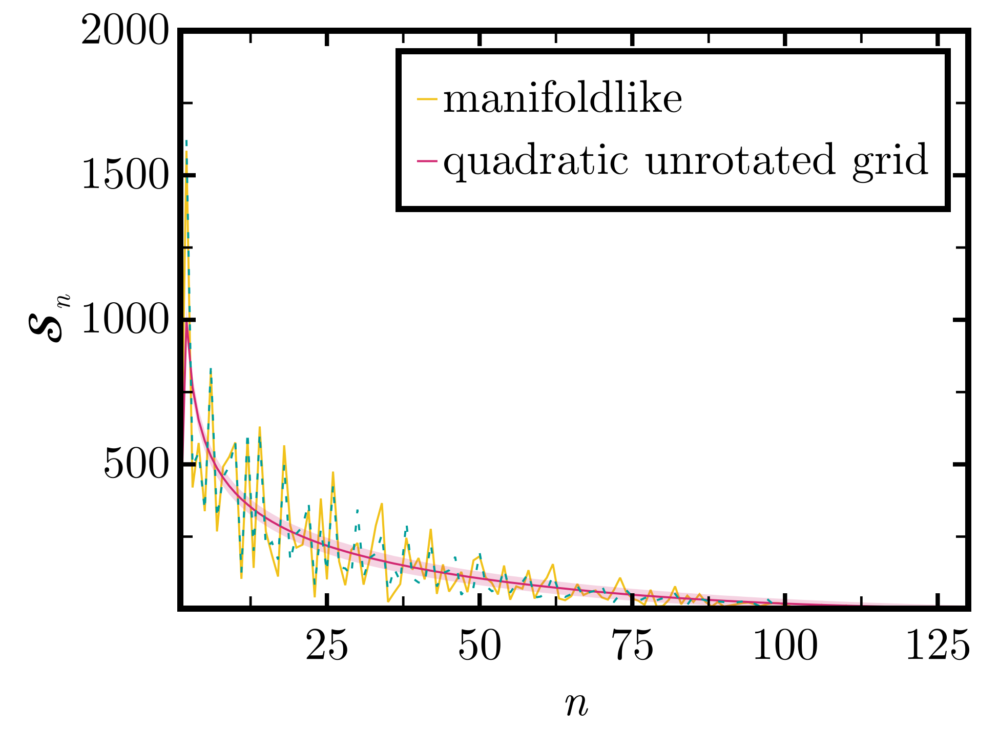

In [13]:
include("./paper_plot_utils.jl")

fit_end = 100
multistart = 100000
K = 9

xs = collect(2:fit_end)
base = average_std_plot_data_comp_quad_grid_man[1][1]
ys = average_std_plot_data_comp_quad_grid_man[2][1]
σs = average_std_plot_data_comp_quad_grid_man[2][2]

function make_F(K)
    ex = :(p.a0)
    for i in 1:K
        ai = Symbol("a$i")
        bi = Symbol("b$i")
        ex = :($ex +
               p.$ai * cos($(2π*i) * x / p.P) +
               p.$bi * sin($(2π*i) * x / p.P))
    end
    return :( (x, p) -> $ex )
end

amps = [.8^n for n in 1:K]  # length K
syms = foldl((acc, i) -> (acc..., Symbol("a$i"), Symbol("b$i")), 1:K; init = (:a0,))

vals = Any[1.0]  # a0
for i in 1:K
    push!(vals, amps[i], amps[i])  # a_i, b_i
end

init = NamedTuple{(syms..., :P)}((vals..., 3.0))

let F = eval(make_F(K))

    param_syms = foldl((acc, i) -> (acc..., Symbol("a$i"), Symbol("b$i")),
                    1:K; init = (:P, :a0))


    model = (x, p) -> base[x] * F(x, p)

    std_fn = (ys, preds, σ, p) -> abs.(F.(xs, Ref(p))) .* σ  # σ scaled by oscillatory factor

    params, res, χ² = fit_histogram_bins(
        ys,
        model,
        param_syms,
        2,
        fit_end;
        stds = σs,
        std_fn = std_fn,
        init = init,
        minimize_χ² = true,
        goodness_of_fit = true,
        multistart = multistart,
        #rng = MersenneTwister(42322),
        verbose = false,
        method = Optim.BFGS(),
        autodiff = AutoForwardDiff()
    )

    println(params)
    println("χ²: ", χ²)

    fig, ax = plot_mean_histograms_with_std(
        average_std_plot_data_comp_quad_grid_man;
        logscale_x = false,
        logscale_y = false,
        xlim = (1., 130.),
        ylim = (1.e0, 2000.),
        xlabel = L"n",
        ylabel = L"\mathcal{S}_n",
        hist_labels = ["manifoldlike", "quadratic unrotated grid"],
        magnification = 3,
        legendpos = :rt,
        legendmargin = (20,20,20,20),
        linewidth = 2,
        return_axis = true,
    )

    lines!(ax, xs, ys[xs] ./ F.(xs, Ref(params));
        color = colorant"#009D9A", linestyle = (:dash, :loose), linewidth = 2)
    fig
end

(P = 1.1759412603119574, a0 = 1.2346336685772232, a1 = -0.2504613228168176, b1 = 0.04026069871024798, a2 = 0.18172158346331546, b2 = -0.029141292627052014, a3 = 0.04932256096982068, b3 = -0.14472688327983851, a4 = 4.73755860850263e-5, b4 = 0.2580295094124979, a5 = 0.3002037262596935, b5 = -0.0853224411548443, a6 = -0.1371686641539832, b6 = 0.03171890507573843, a7 = 0.056022185656738686, b7 = -0.021122048210354256, a8 = 0.030826824887094248, b8 = -0.215516556111872, a9 = 0.004139755095031991, b9 = 0.2813584294672528, a10 = -0.28785401653204806, b10 = -0.3061184641752679)
χ²: 3.571338209497656


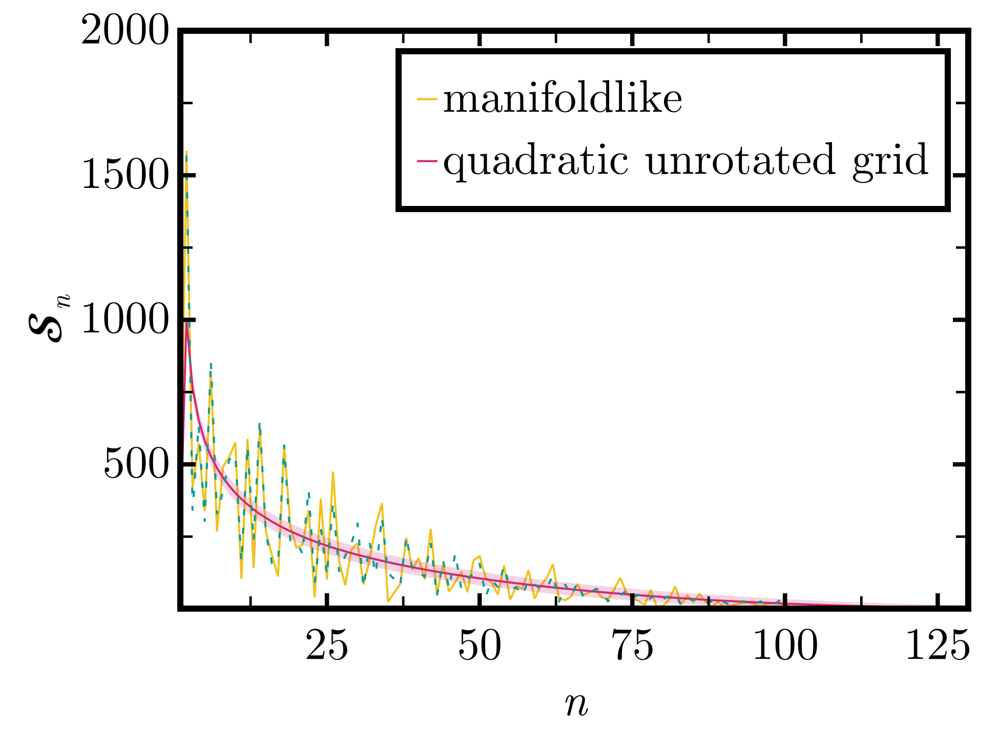

In [14]:
include("./paper_plot_utils.jl")

fit_end = 100
multistart = 100000
K = 10

xs = collect(2:fit_end)
base = average_std_plot_data_comp_quad_grid_man[1][1]
ys = average_std_plot_data_comp_quad_grid_man[2][1]
σs = average_std_plot_data_comp_quad_grid_man[2][2]

function make_F(K)
    ex = :(p.a0)
    for i in 1:K
        ai = Symbol("a$i")
        bi = Symbol("b$i")
        ex = :($ex +
               p.$ai * cos($(2π*i) * x / p.P) +
               p.$bi * sin($(2π*i) * x / p.P))
    end
    return :( (x, p) -> $ex )
end

amps = [.8^n for n in 1:K]  # length K
syms = foldl((acc, i) -> (acc..., Symbol("a$i"), Symbol("b$i")), 1:K; init = (:a0,))

vals = Any[1.0]  # a0
for i in 1:K
    push!(vals, amps[i], amps[i])  # a_i, b_i
end

init = NamedTuple{(syms..., :P)}((vals..., 3.0))

let F = eval(make_F(K))

    param_syms = foldl((acc, i) -> (acc..., Symbol("a$i"), Symbol("b$i")),
                    1:K; init = (:P, :a0))


    model = (x, p) -> base[x] * F(x, p)

    std_fn = (ys, preds, σ, p) -> abs.(F.(xs, Ref(p))) .* σ  # σ scaled by oscillatory factor

    params, res, χ² = fit_histogram_bins(
        ys,
        model,
        param_syms,
        2,
        fit_end;
        stds = σs,
        std_fn = std_fn,
        init = init,
        minimize_χ² = true,
        goodness_of_fit = true,
        multistart = multistart,
        #rng = MersenneTwister(42322),
        verbose = false,
        method = Optim.BFGS(),
        autodiff = AutoForwardDiff()
    )

    println(params)
    println("χ²: ", χ²)

    fig, ax = plot_mean_histograms_with_std(
        average_std_plot_data_comp_quad_grid_man;
        logscale_x = false,
        logscale_y = false,
        xlim = (1., 130.),
        ylim = (1.e0, 2000.),
        xlabel = L"n",
        ylabel = L"\mathcal{S}_n",
        hist_labels = ["manifoldlike", "quadratic unrotated grid"],
        magnification = 3,
        legendpos = :rt,
        legendmargin = (20,20,20,20),
        linewidth = 2,
        return_axis = true,
    )

    lines!(ax, xs, ys[xs] ./ F.(xs, Ref(params));
        color = colorant"#009D9A", linestyle = (:dash, :loose), linewidth = 2)
    fig
end

### Nonlinear fit

multistart 1: χ² = 9.59223765190351 (best = 9.59223765190351)
multistart 100: χ² = 16.361688563451338 (best = 8.757648468735056)
multistart 200: χ² = 16.553989445799374 (best = 5.895569996328309)
multistart 300: χ² = 79.62057846061113 (best = 5.895569996328309)
multistart 400: χ² = 16.12401595447313 (best = 5.895569996328309)
multistart 500: χ² = 15.041090203972006 (best = 5.895569996328309)
multistart 600: χ² = 16.639772389920303 (best = 5.895569996328309)
multistart 700: χ² = 63.69020987314743 (best = 5.895569996328309)
multistart 800: χ² = 76.0690935351885 (best = 5.895569996328309)
multistart 900: χ² = 15.98376369944405 (best = 5.895569760035072)
multistart 1000: χ² = 14.860212117354038 (best = 5.895569760035072)
multistart done: best χ² = 5.895569760035072
(c = 1.1700098950124804, a1 = 0.1603975275198034, b1 = -0.27191046569911664, P1 = 4.020673831889423, a2 = -0.35307378736791384, b2 = 0.18860827923948303, P2 = 2.0161610963387955)
χ²: 5.895569760035072


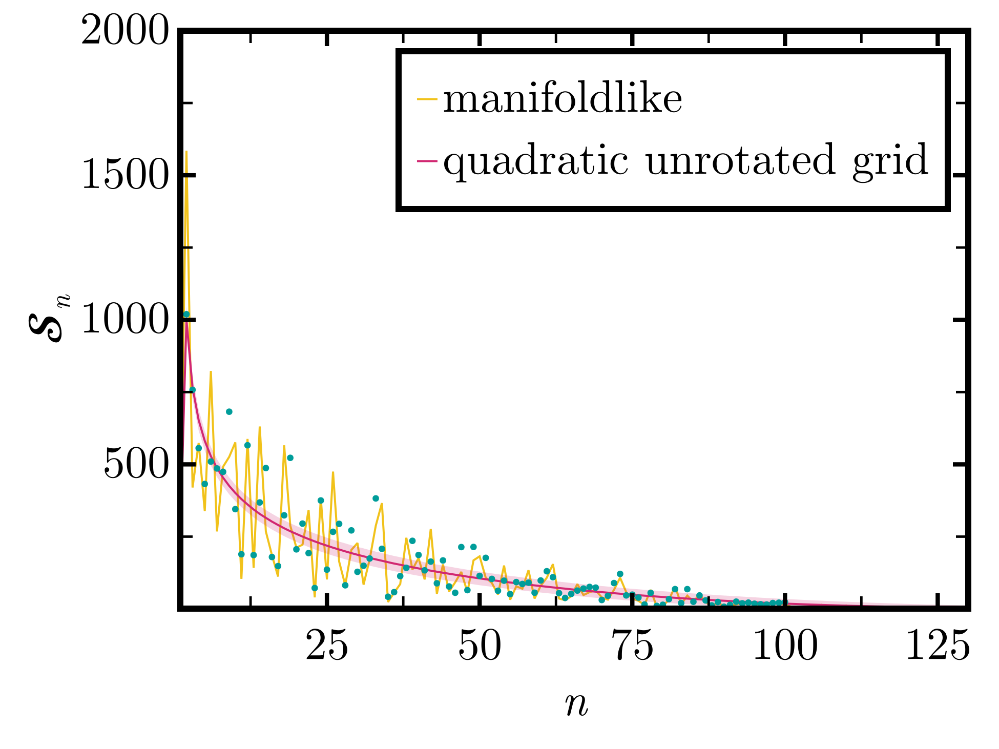

In [88]:
include("./paper_plot_utils.jl")

fit_end = 100
multistart = 1000
K = 2

xs = collect(2:fit_end)
base = average_std_plot_data_comp_quad_grid_man[1][1]
ys = average_std_plot_data_comp_quad_grid_man[2][1]
σs = average_std_plot_data_comp_quad_grid_man[2][2]

function make_F_freeP(K)
    ex = :(p.c)
    for i in 1:K
        ai = Symbol("a$i")
        bi = Symbol("b$i")
        Pi = Symbol("P$i")
        ex = :($ex +
               p.$ai * cos(2π * x / p.$Pi) +
               p.$bi * sin(2π * x / p.$Pi))
    end
    return :( (x, p) -> $ex )
end

param_syms = foldl(
    (acc, i) -> (acc..., Symbol("a$i"), Symbol("b$i"), Symbol("P$i")),
    1:K; init = (:c,)
)

amps = [0.3 / i for i in 1:K]
periods = [4.0 * i for i in 1:K]

vals = Any[1.0]  # c
for i in 1:K
    push!(vals, amps[i], amps[i], periods[i])
end
init = NamedTuple{param_syms}(Tuple(vals))

# bounds: c, a_i, b_i free; P_i in [2, 20]
lo_vals = Any[-Inf]
hi_vals = Any[Inf]
for i in 1:K
    push!(lo_vals, -Inf, -Inf, 2.0)   # a_i, b_i, P_i
    push!(hi_vals,  Inf,  Inf, 20.0)
end
bounds = (NamedTuple{param_syms}(Tuple(lo_vals)),
          NamedTuple{param_syms}(Tuple(hi_vals)))

let F = eval(make_F_freeP(K))
    model = (x, p) -> base[x] * F(x, p)
    std_fn = (ys, preds, σ, p) -> abs.(F.(xs, Ref(p))) .* σ

    params, res, χ² = fit_histogram_bins(
        ys,
        model,
        param_syms,
        2,
        fit_end;
        stds = σs,
        std_fn = std_fn,
        init = init,
        bounds = bounds,
        minimize_χ² = true,
        goodness_of_fit = true,
        multistart = multistart,
        verbose = true,
        method = Optim.NelderMead(),
    )

    println(params)
    println("χ²: ", χ²)

    fig, ax = plot_mean_histograms_with_std(
        average_std_plot_data_comp_quad_grid_man;
        logscale_x = false,
        logscale_y = false,
        xlim = (1., 130.),
        ylim = (1.e0, 2000.),
        xlabel = L"n",
        ylabel = L"\mathcal{S}_n",
        hist_labels = ["manifoldlike", "quadratic unrotated grid"],
        magnification = 3,
        legendpos = :rt,
        legendmargin = (20,20,20,20),
        linewidth = 2,
        return_axis = true,
    )

    scatter!(ax, xs, base[xs] .* F.(xs, Ref(params));
           color = colorant"#009D9A")
    fig
end

